This notebook tries to identify images of polyps in intestine that can help in early detection of colorectal cancer


Dataset link: https://paperswithcode.com/dataset/medico-automatic-polyp-segmentation-challenge#:~:text=Automatic%20Polyp%20Segmentation-,The%20“Medico%20automatic%20polyp%20segmentation%20challenge”%20aims%20to%20develop%20computer,with%20high%20efficiency%20and%20accuracy.
Download dataset from here https://datasets.simula.no/kvasir-seg/ to the ./data folder and replace the path while instantiating dataset 

In [1]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None, train=True):
        self.root_dir = root_dir
        self.transform = transform
        self.train = train

        # List all image and mask files
        self.image_files = sorted([f for f in os.listdir(os.path.join(root_dir, 'images')) if f.endswith('.jpg')])
        self.mask_files = sorted([f for f in os.listdir(os.path.join(root_dir, 'masks')) if f.endswith('.jpg')])

        # Split dataset into train and test
        if self.train:
            self.image_files = self.image_files[:800]
            self.mask_files = self.mask_files[:800]
        else:
            self.image_files = self.image_files[800:]
            self.mask_files = self.mask_files[800:]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load image and mask
        img_path = os.path.join(self.root_dir, 'images', self.image_files[idx])
        mask_path = os.path.join(self.root_dir, 'masks', self.mask_files[idx])
        image = cv2.imread(img_path)
        mask = cv2.imread(mask_path)

        # Preprocess the mask
        mask = self.process_mask(mask)

        # Apply transformations
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return {'image': image, 'mask': mask}

    def process_mask(self, mask):
        # Convert mask values as per your requirement
        mask[mask <= 8] = 0
        mask[mask >= 246] = 255
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        return mask

In [2]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((256, 256))
])

train_dataset = CustomDataset(root_dir='/root/GATech/cs7643/polyps_detection/data/Kvasir-SEG', transform=transform, train=True)
val_dataset = CustomDataset(root_dir='/root/GATech/cs7643/polyps_detection/data/Kvasir-SEG', transform=transform, train=False)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True)

/usr/local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


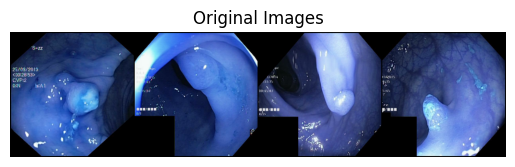

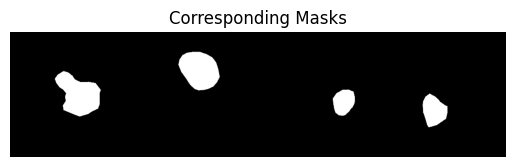

In [3]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import torchvision.transforms.functional as TF

def reverse_transform(tensor):
    """Converts a PyTorch tensor to a NumPy array for visualization."""
    image = tensor.cpu().clone()
    image = image.squeeze(0)  # Remove batch dimension
    image = TF.to_pil_image(image)
    return np.array(image)

# Visualize some random samples from the test dataset
num_samples = 4

for batch in val_loader:
    images, masks = batch['image'], batch['mask']
    break  # Break after the first batch

# Visualize original images
grid_images = make_grid(images[:num_samples], nrow=num_samples)
plt.imshow(reverse_transform(grid_images))
plt.title('Original Images')
plt.axis('off')
plt.show()

# Visualize corresponding masks
grid_masks = make_grid(masks[:num_samples], nrow=num_samples)
plt.imshow(reverse_transform(grid_masks), cmap='gray')
plt.title('Corresponding Masks')
plt.axis('off')
plt.show()


In [4]:
len(train_loader)

50

In [7]:
# Check for CUDA availability
from unet import UNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

def init_weights(m):
    if isinstance(m, torch.nn.Conv2d):
        torch.nn.init.xavier_uniform(m.weight)

# Initialize the model
model = UNet(3, 1, [64, 128, 256, 512])

# Move the model to the CUDA device if available
model = model.to(device)

epochs = 30
lr = 0.001
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(params=model.parameters(), lr=lr)

Using device: cuda


In [55]:
def pixel_acc(outputs, mask):
    outputs = (outputs > 0.5).float()  # Convert probability to binary prediction
    correct_pixels = torch.eq(outputs, mask).float().sum()
    total_pixels = mask.numel()
    accuracy = correct_pixels / total_pixels
    return accuracy

def calculate_iou(outputs, mask):
    outputs = (outputs > 0.5).float()
    intersection = torch.logical_and(outputs, mask).sum()
    union = torch.logical_or(outputs, mask).sum()
    iou = intersection / union if union != 0 else 0.0
    return iou

def dice_index(outputs, mask):
    smooth = 1e-5
    outputs = (outputs > 0.5).float()
    intersection = torch.sum(outputs * mask)
    union = torch.sum(outputs) + torch.sum(mask)
    dice = (2.0 * intersection + smooth) / (union + smooth)
    return dice

EPOCH 0:


Training Loop, Epoch: 0: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.7222541069984436, Training accuracy: 0.9407258629798889, DICE:0.8036387920379638 ,IOU: 0.6744399070739746


Validation Loop, Epoch: 0:   0%|          | 0/13 [00:00<?, ?it/s]

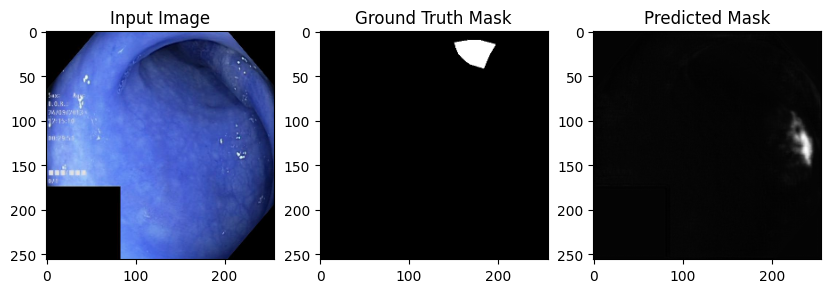

Validation Loop, Epoch: 0: 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Validation loss: 0.7189783499791071, Validation accuracy: 0.92377769947052,DICE:0.7521875500679016,IOU: 0.6090772151947021
EPOCH 1:


Training Loop, Epoch: 1: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.718102822303772, Training accuracy: 0.9442949295043945, DICE:0.81637739777565 ,IOU: 0.6937116980552673


Validation Loop, Epoch: 1:   0%|          | 0/13 [00:00<?, ?it/s]

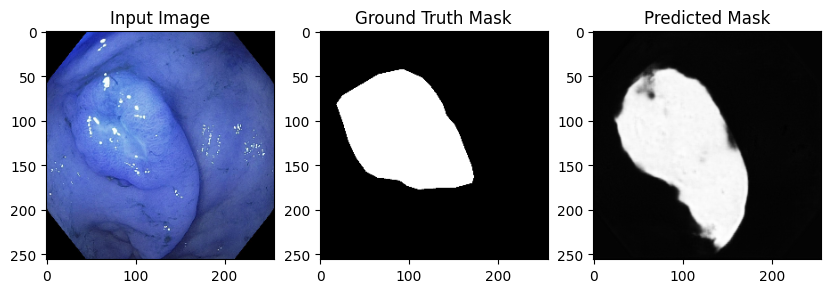

Validation Loop, Epoch: 1: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.7147382818735563, Validation accuracy: 0.9187661409378052,DICE:0.719573988364293,IOU: 0.5660325884819031
EPOCH 2:


Training Loop, Epoch: 2: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.714999293088913, Training accuracy: 0.945577085018158, DICE:0.8210148465633392 ,IOU: 0.7000252604484558


Validation Loop, Epoch: 2:   0%|          | 0/13 [00:00<?, ?it/s]

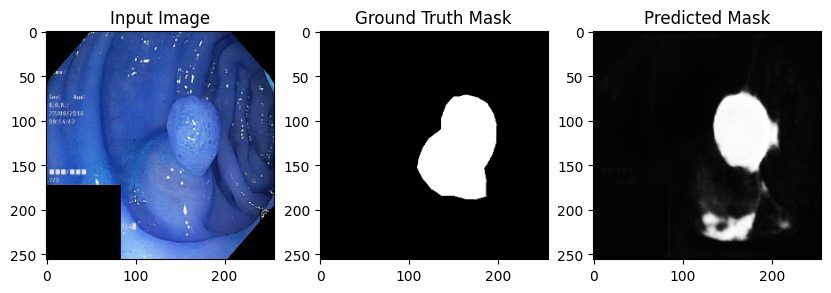

Validation Loop, Epoch: 2: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.7128332119721633, Validation accuracy: 0.909669041633606,DICE:0.6820062765708337,IOU: 0.5230403542518616
EPOCH 3:


Training Loop, Epoch: 3: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.7123443615436554, Training accuracy: 0.9467718005180359, DICE:0.822481300830841 ,IOU: 0.701454222202301


Validation Loop, Epoch: 3:   0%|          | 0/13 [00:00<?, ?it/s]

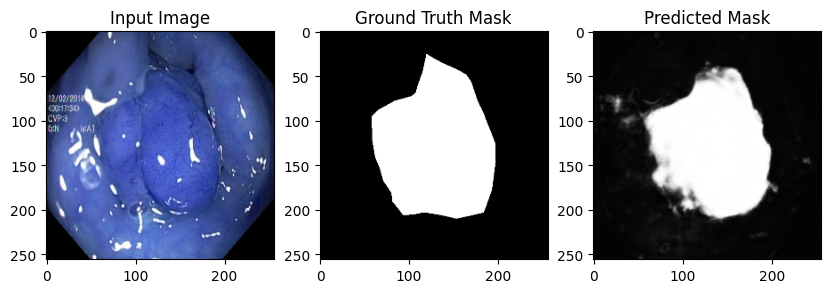

Validation Loop, Epoch: 3: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.712302565574646, Validation accuracy: 0.9212855696678162,DICE:0.7387550152265109,IOU: 0.5909369587898254
EPOCH 4:


Training Loop, Epoch: 4: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.7090437984466553, Training accuracy: 0.9490867257118225, DICE:0.8316124713420868 ,IOU: 0.7148023247718811


Validation Loop, Epoch: 4:   0%|          | 0/13 [00:00<?, ?it/s]

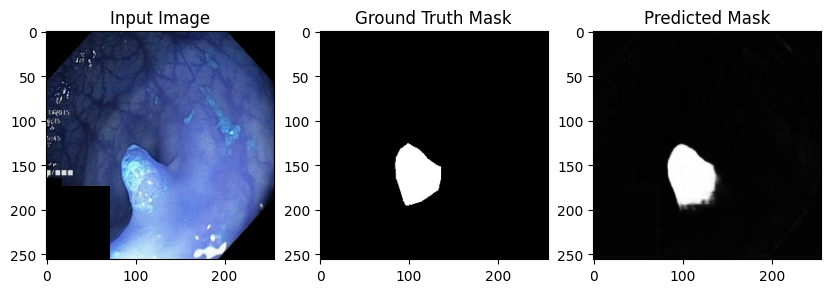

Validation Loop, Epoch: 4: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.7098657901470478, Validation accuracy: 0.9140803813934326,DICE:0.6804937491050134,IOU: 0.5200961232185364
EPOCH 5:


Training Loop, Epoch: 5: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.7068038582801819, Training accuracy: 0.9496488571166992, DICE:0.8307383453845978 ,IOU: 0.713517963886261


Validation Loop, Epoch: 5:   0%|          | 0/13 [00:00<?, ?it/s]

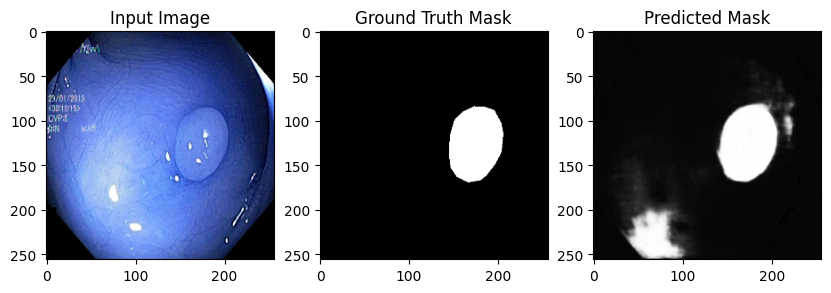

Validation Loop, Epoch: 5: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.7067087751168472, Validation accuracy: 0.9246290326118469,DICE:0.759986909536215,IOU: 0.6153554320335388
EPOCH 6:


Training Loop, Epoch: 6: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.7029125225543976, Training accuracy: 0.9538878202438354, DICE:0.8478307116031647 ,IOU: 0.7384200692176819


Validation Loop, Epoch: 6:   0%|          | 0/13 [00:00<?, ?it/s]

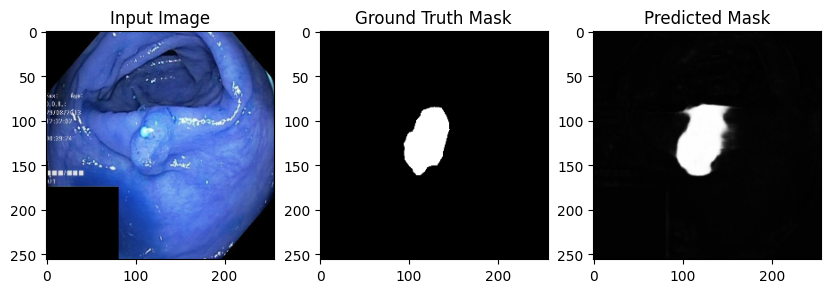

Validation Loop, Epoch: 6: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.7029605920498188, Validation accuracy: 0.9322472214698792,DICE:0.7818989432775058,IOU: 0.6438398361206055
EPOCH 7:


Training Loop, Epoch: 7: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.7006323373317719, Training accuracy: 0.9550762176513672, DICE:0.8514131772518158 ,IOU: 0.7437889575958252


Validation Loop, Epoch: 7:   0%|          | 0/13 [00:00<?, ?it/s]

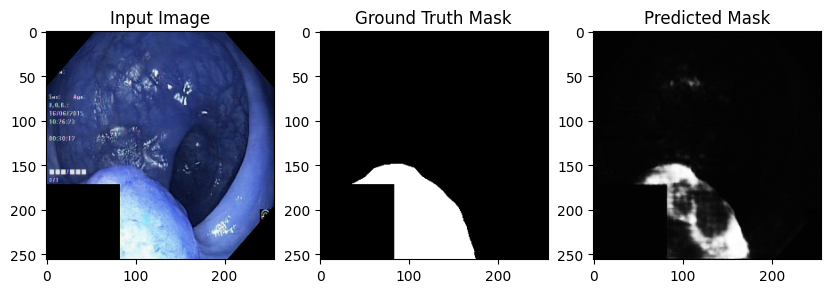

Validation Loop, Epoch: 7: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.7046670317649841, Validation accuracy: 0.9278667569160461,DICE:0.7610431405214163,IOU: 0.620692789554596
EPOCH 8:


Training Loop, Epoch: 8: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6967336189746857, Training accuracy: 0.9596554636955261, DICE:0.8687347543239593 ,IOU: 0.7709536552429199


Validation Loop, Epoch: 8:   0%|          | 0/13 [00:00<?, ?it/s]

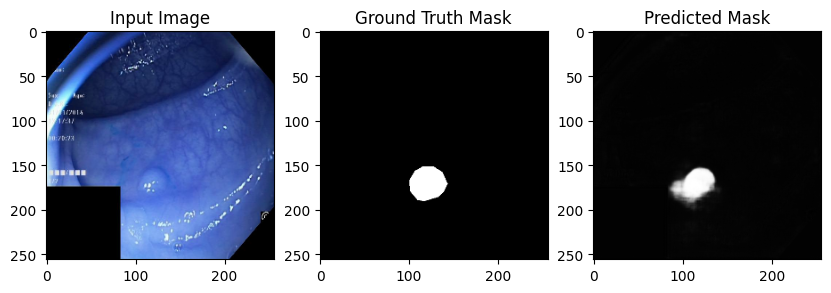

Validation Loop, Epoch: 8: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.7034819997273959, Validation accuracy: 0.927617609500885,DICE:0.7740059724220862,IOU: 0.6385465860366821
EPOCH 9:


Training Loop, Epoch: 9: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6943703114986419, Training accuracy: 0.9611886143684387, DICE:0.874211630821228 ,IOU: 0.7781493067741394


Validation Loop, Epoch: 9:   0%|          | 0/13 [00:00<?, ?it/s]

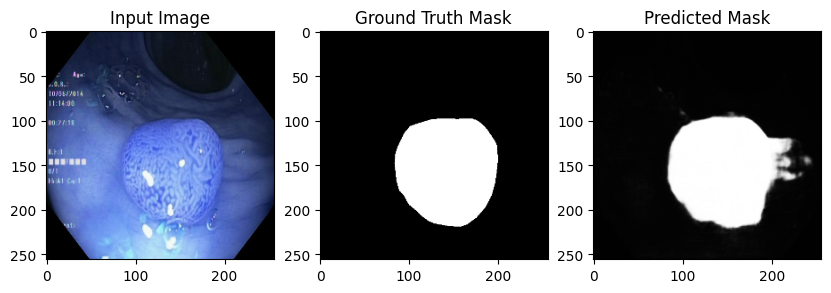

Validation Loop, Epoch: 9: 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]


Validation loss: 0.7005722935383136, Validation accuracy: 0.9286795258522034,DICE:0.7629050016403198,IOU: 0.621850311756134
EPOCH 10:


Training Loop, Epoch: 10: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6936304485797882, Training accuracy: 0.959359347820282, DICE:0.8672844755649567 ,IOU: 0.7679901719093323


Validation Loop, Epoch: 10:   0%|          | 0/13 [00:00<?, ?it/s]

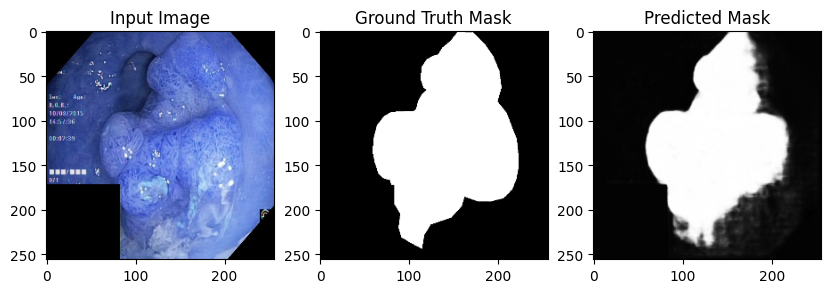

Validation Loop, Epoch: 10: 100%|██████████| 13/13 [00:05<00:00,  2.29it/s]


Validation loss: 0.6974357687509977, Validation accuracy: 0.9267117977142334,DICE:0.7459508088918833,IOU: 0.5969913601875305
EPOCH 11:


Training Loop, Epoch: 11: 100%|██████████| 50/50 [00:35<00:00,  1.39it/s]


Training loss: 0.6908954083919525, Training accuracy: 0.9618998765945435, DICE:0.8750114703178405 ,IOU: 0.7803849577903748


Validation Loop, Epoch: 11:   0%|          | 0/13 [00:00<?, ?it/s]

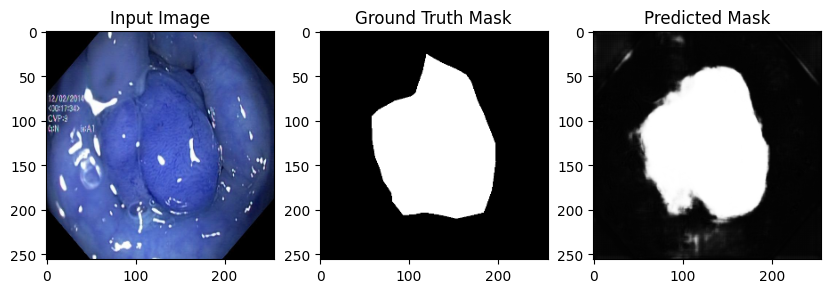

Validation Loop, Epoch: 11: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.711243042579064, Validation accuracy: 0.9118685126304626,DICE:0.7526828784209031,IOU: 0.606824517250061
EPOCH 12:


Training Loop, Epoch: 12: 100%|██████████| 50/50 [00:35<00:00,  1.39it/s]


Training loss: 0.6887716424465179, Training accuracy: 0.9634711742401123, DICE:0.878950513601303 ,IOU: 0.7855770587921143


Validation Loop, Epoch: 12:   0%|          | 0/13 [00:00<?, ?it/s]

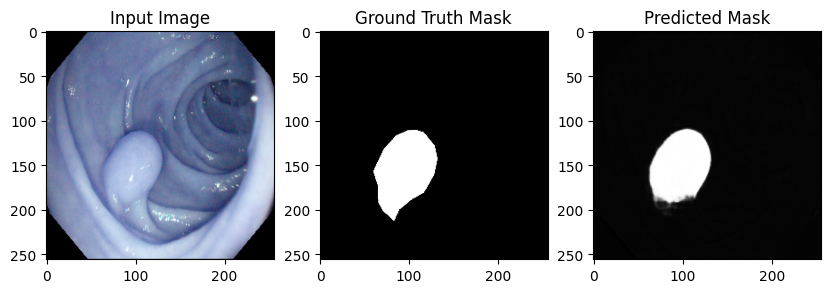

Validation Loop, Epoch: 12: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Validation loss: 0.6940073233384353, Validation accuracy: 0.9237862825393677,DICE:0.7313968309989343,IOU: 0.5867972373962402
EPOCH 13:


Training Loop, Epoch: 13: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6860654544830322, Training accuracy: 0.966315746307373, DICE:0.8905391275882721 ,IOU: 0.8046877980232239


Validation Loop, Epoch: 13:   0%|          | 0/13 [00:00<?, ?it/s]

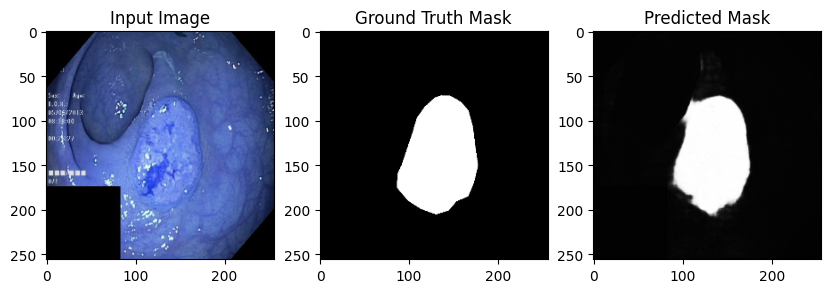

Validation Loop, Epoch: 13: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Validation loss: 0.6959766791417048, Validation accuracy: 0.9286450147628784,DICE:0.7828041315078735,IOU: 0.6478582620620728
EPOCH 14:


Training Loop, Epoch: 14: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.684457300901413, Training accuracy: 0.9667755961418152, DICE:0.8921892309188842 ,IOU: 0.8063869476318359


Validation Loop, Epoch: 14:   0%|          | 0/13 [00:00<?, ?it/s]

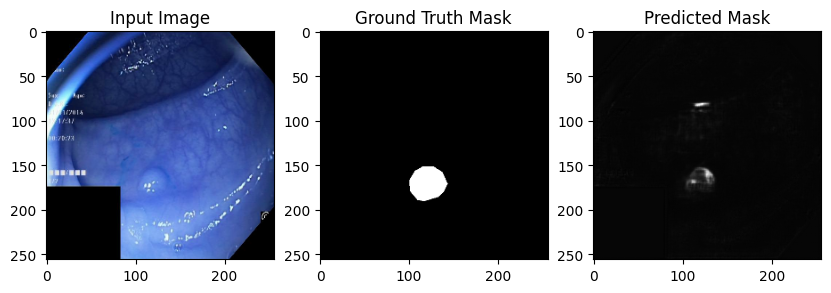

Validation Loop, Epoch: 14: 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Validation loss: 0.6894850409947909, Validation accuracy: 0.9312154650688171,DICE:0.7768425299571111,IOU: 0.6403855681419373
EPOCH 15:


Training Loop, Epoch: 15: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6822662651538849, Training accuracy: 0.9690295457839966, DICE:0.8991417181491852 ,IOU: 0.8186837434768677


Validation Loop, Epoch: 15:   0%|          | 0/13 [00:00<?, ?it/s]

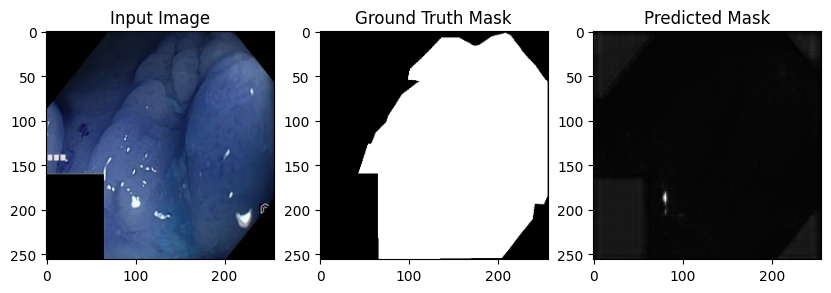

Validation Loop, Epoch: 15: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Validation loss: 0.6949564401920025, Validation accuracy: 0.9312119483947754,DICE:0.7790921101203332,IOU: 0.6410486698150635
EPOCH 16:


Training Loop, Epoch: 16: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.681808911561966, Training accuracy: 0.9674496054649353, DICE:0.8933072280883789 ,IOU: 0.8088482618331909


Validation Loop, Epoch: 16:   0%|          | 0/13 [00:00<?, ?it/s]

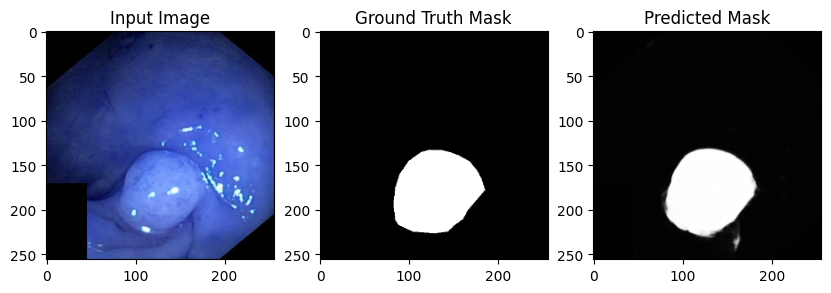

Validation Loop, Epoch: 16: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Validation loss: 0.689182671216818, Validation accuracy: 0.9327199459075928,DICE:0.7816028824219337,IOU: 0.6459559202194214
EPOCH 17:


Training Loop, Epoch: 17: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.680057921409607, Training accuracy: 0.9688484072685242, DICE:0.8995388758182525 ,IOU: 0.8187845349311829


Validation Loop, Epoch: 17:   0%|          | 0/13 [00:00<?, ?it/s]

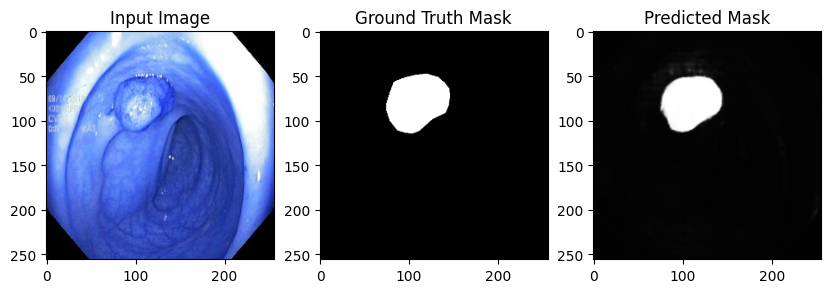

Validation Loop, Epoch: 17: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.689264022386991, Validation accuracy: 0.9296971559524536,DICE:0.7773664822945228,IOU: 0.6389053463935852
EPOCH 18:


Training Loop, Epoch: 18: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6786861312389374, Training accuracy: 0.9694159626960754, DICE:0.901641628742218 ,IOU: 0.8223341703414917


Validation Loop, Epoch: 18:   0%|          | 0/13 [00:00<?, ?it/s]

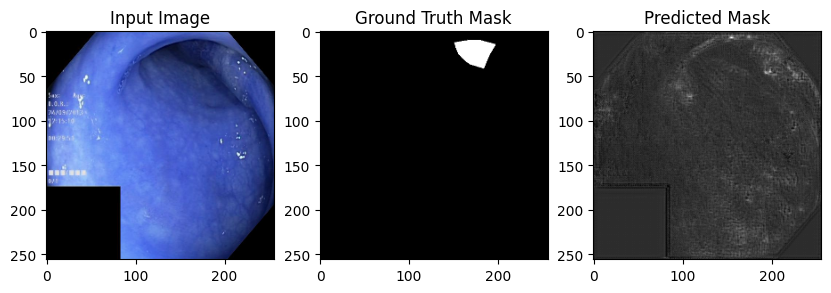

Validation Loop, Epoch: 18: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.6874644756317139, Validation accuracy: 0.9293738603591919,DICE:0.7723598250975976,IOU: 0.6344980597496033
EPOCH 19:


Training Loop, Epoch: 19: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.675387110710144, Training accuracy: 0.9743359684944153, DICE:0.9183896541595459 ,IOU: 0.8496198058128357


Validation Loop, Epoch: 19:   0%|          | 0/13 [00:00<?, ?it/s]

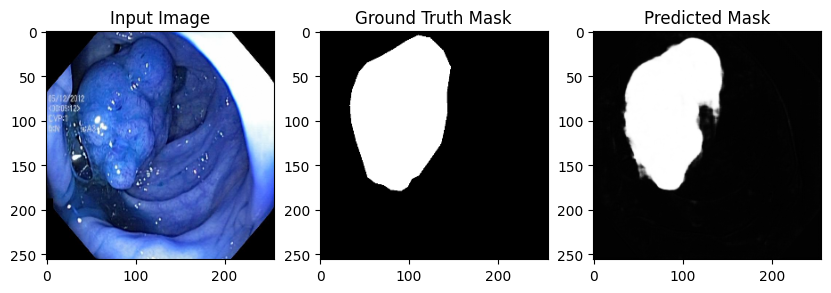

Validation Loop, Epoch: 19: 100%|██████████| 13/13 [00:05<00:00,  2.33it/s]


Validation loss: 0.6843215318826529, Validation accuracy: 0.9353604912757874,DICE:0.7946892289014963,IOU: 0.6617878079414368
EPOCH 20:


Training Loop, Epoch: 20: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6736046350002289, Training accuracy: 0.9761200547218323, DICE:0.9250277352333068 ,IOU: 0.8608328104019165


Validation Loop, Epoch: 20:   0%|          | 0/13 [00:00<?, ?it/s]

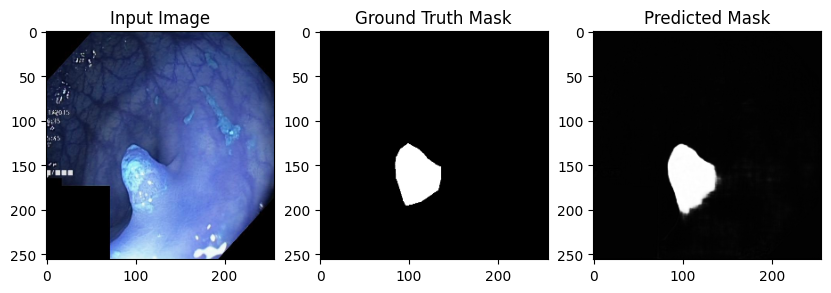

Validation Loop, Epoch: 20: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.6826898776567899, Validation accuracy: 0.9339252710342407,DICE:0.7900724502710196,IOU: 0.6550207138061523
EPOCH 21:


Training Loop, Epoch: 21: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6725633203983307, Training accuracy: 0.9762287139892578, DICE:0.9249299967288971 ,IOU: 0.8608150482177734


Validation Loop, Epoch: 21:   0%|          | 0/13 [00:00<?, ?it/s]

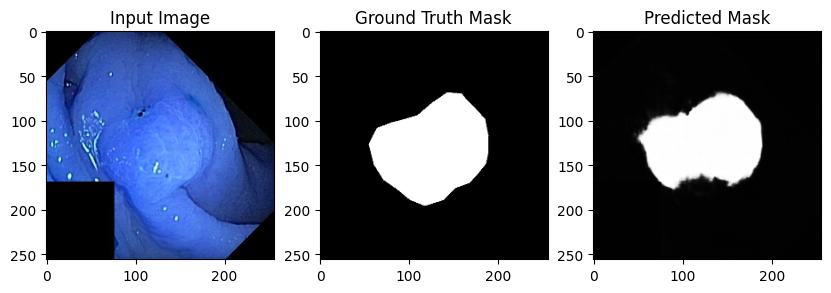

Validation Loop, Epoch: 21: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]


Validation loss: 0.6843117062862103, Validation accuracy: 0.9348475933074951,DICE:0.7994485451624944,IOU: 0.6683982014656067
EPOCH 22:


Training Loop, Epoch: 22: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6717445075511932, Training accuracy: 0.9759681224822998, DICE:0.9248186504840851 ,IOU: 0.8603180646896362


Validation Loop, Epoch: 22:   0%|          | 0/13 [00:00<?, ?it/s]

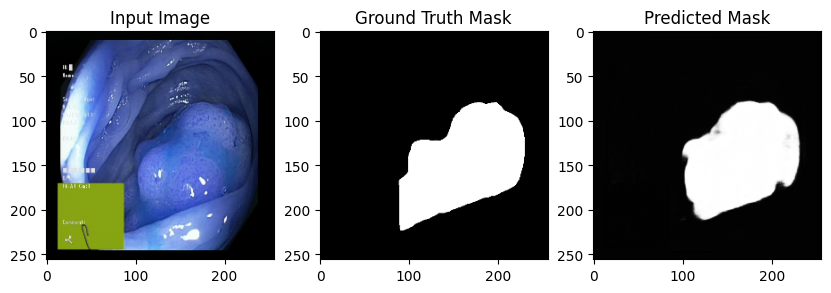

Validation Loop, Epoch: 22: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.6819174014605008, Validation accuracy: 0.9253448247909546,DICE:0.7495029339423547,IOU: 0.6019054055213928
EPOCH 23:


Training Loop, Epoch: 23: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6699037837982178, Training accuracy: 0.9782898426055908, DICE:0.9318920171260834 ,IOU: 0.8722918033599854


Validation Loop, Epoch: 23:   0%|          | 0/13 [00:00<?, ?it/s]

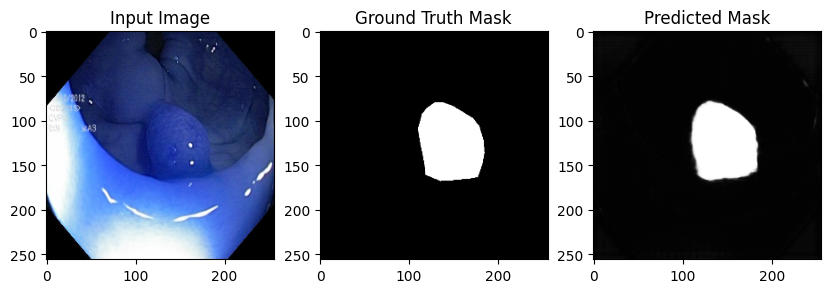

Validation Loop, Epoch: 23: 100%|██████████| 13/13 [00:05<00:00,  2.29it/s]


Validation loss: 0.6850158755595868, Validation accuracy: 0.9246958494186401,DICE:0.7346743528659527,IOU: 0.5855980515480042
EPOCH 24:


Training Loop, Epoch: 24: 100%|██████████| 50/50 [00:35<00:00,  1.39it/s]


Training loss: 0.6687344896793366, Training accuracy: 0.9788409471511841, DICE:0.9338391649723053 ,IOU: 0.8758090734481812


Validation Loop, Epoch: 24:   0%|          | 0/13 [00:00<?, ?it/s]

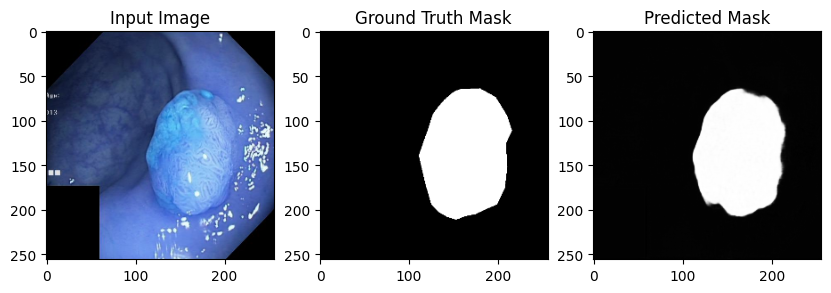

Validation Loop, Epoch: 24: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.6854563447145315, Validation accuracy: 0.9318004250526428,DICE:0.7966091128496023,IOU: 0.6681819558143616
EPOCH 25:


Training Loop, Epoch: 25: 100%|██████████| 50/50 [00:35<00:00,  1.39it/s]


Training loss: 0.6676531195640564, Training accuracy: 0.9795410633087158, DICE:0.9362253284454346 ,IOU: 0.8799155354499817


Validation Loop, Epoch: 25:   0%|          | 0/13 [00:00<?, ?it/s]

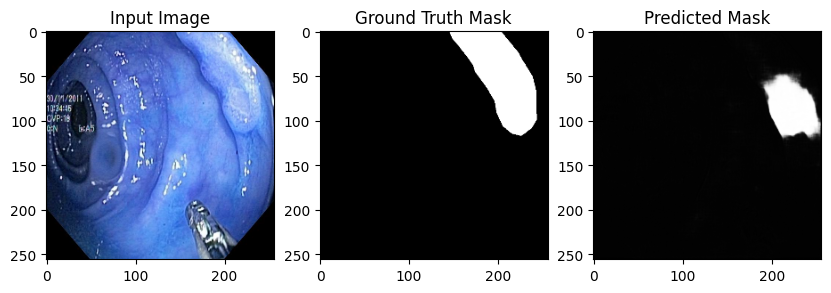

Validation Loop, Epoch: 25: 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]


Validation loss: 0.6770718968831576, Validation accuracy: 0.9357193112373352,DICE:0.8000694925968463,IOU: 0.6685539484024048
EPOCH 26:


Training Loop, Epoch: 26: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6682350707054138, Training accuracy: 0.976750910282135, DICE:0.9253589117527008 ,IOU: 0.8615437746047974


Validation Loop, Epoch: 26:   0%|          | 0/13 [00:00<?, ?it/s]

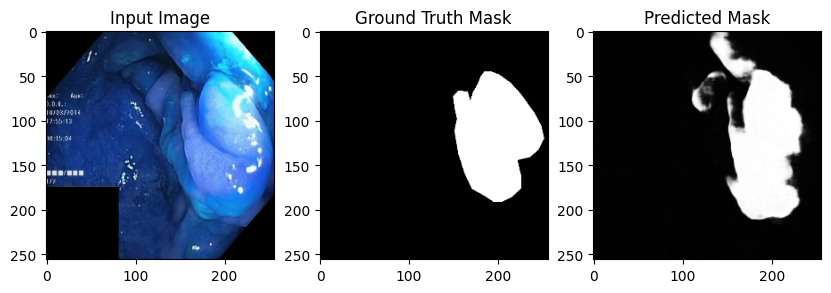

Validation Loop, Epoch: 26: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]


Validation loss: 0.6770348594738886, Validation accuracy: 0.9313734769821167,DICE:0.7767795874522283,IOU: 0.6367536783218384
EPOCH 27:


Training Loop, Epoch: 27: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6663198924064636, Training accuracy: 0.979292094707489, DICE:0.935721127986908 ,IOU: 0.8788629770278931


Validation Loop, Epoch: 27:   0%|          | 0/13 [00:00<?, ?it/s]

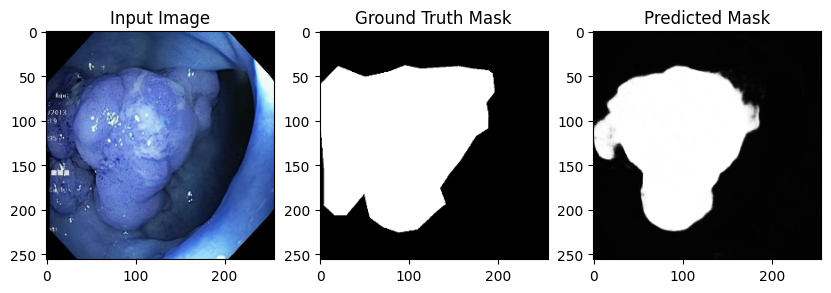

Validation Loop, Epoch: 27: 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]


Validation loss: 0.6784118551474351, Validation accuracy: 0.9345697164535522,DICE:0.7940489924871005,IOU: 0.6613120436668396
EPOCH 28:


Training Loop, Epoch: 28: 100%|██████████| 50/50 [00:35<00:00,  1.39it/s]


Training loss: 0.6650808334350586, Training accuracy: 0.9805145263671875, DICE:0.9402775287628173 ,IOU: 0.887039303779602


Validation Loop, Epoch: 28:   0%|          | 0/13 [00:00<?, ?it/s]

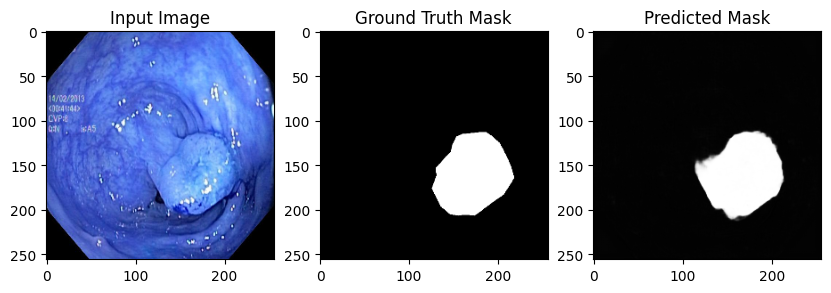

Validation Loop, Epoch: 28: 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]


Validation loss: 0.679127587721898, Validation accuracy: 0.9291040301322937,DICE:0.7707293858894935,IOU: 0.629673957824707
EPOCH 29:


Training Loop, Epoch: 29: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]


Training loss: 0.6658276510238648, Training accuracy: 0.9773901104927063, DICE:0.9296713304519654 ,IOU: 0.8686468601226807


Validation Loop, Epoch: 29:   0%|          | 0/13 [00:00<?, ?it/s]

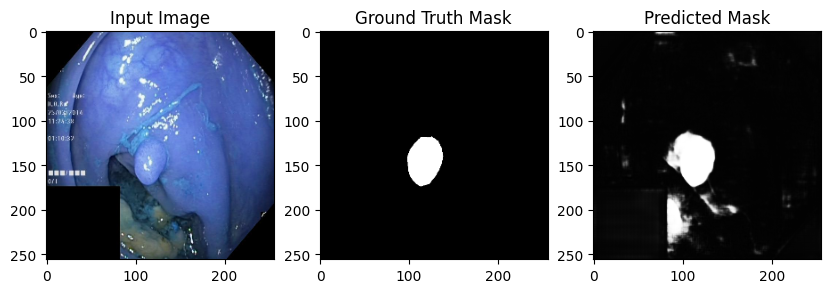

Validation Loop, Epoch: 29: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]

Validation loss: 0.6818402638802161, Validation accuracy: 0.9279736280441284,DICE:0.7764155268669128,IOU: 0.6364405751228333


In [25]:

# Training and validation code
for epoch in range(epochs):
    print(f"EPOCH {epoch}:")
    model.train()
    batch_loss = batch_acc = batch_iou=batch_pacc=0.0

    for batch in tqdm(train_loader, desc=f"Training Loop, Epoch: {epoch}"):
        # Move data to CUDA
        img, mask = batch['image'], batch['mask']
        img, mask = img.to(device), mask.to(device)
        optimizer.zero_grad()
        outs = model(img)
        # loss=dice_loss(outs, mask)
        loss=criterion(outs,mask)
        # loss = class_balanced_focal_ce_loss(outs, mask, weights=class_weights, gamma=2)
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            accuracy = dice_index(outs, mask)
            iou=calculate_iou(outs,mask)
            pacc=pixel_acc(outs,mask)
            batch_loss += loss.item()
            batch_acc += accuracy.item()
            batch_iou+=iou
            batch_pacc+=pacc

    batch_loss /= len(train_loader)
    batch_acc /= len(train_loader)
    batch_iou/=len(train_loader)
    batch_pacc/=len(train_loader)
    print(f"Training loss: {batch_loss}, Training accuracy: {batch_pacc}, DICE:{batch_acc} ,IOU: {batch_iou}")
    model.eval()
    val_loss = val_acc = val_iou=val_pacc=0.0

    with torch.no_grad():
        sample_printed = False
        for batch in tqdm(val_loader, desc=f"Validation Loop, Epoch: {epoch}"):
            # Move data to CUDA
            img, mask = batch['image'], batch['mask']
            img, mask = img.to(device), mask.to(device)
            
            
            outs = model(img)
            loss=criterion(outs, mask)
            iou=calculate_iou(outs,mask)
            pacc=pixel_acc(outs,mask)
            accuracy = dice_index(outs, mask)
            val_loss += loss.item()
            val_acc += accuracy.item()
            val_iou+=iou
            val_pacc+=pacc
            
            if not sample_printed:
                sample_printed = True
                idx = 0  # Choose the index of the sample to print
                sample_img = img[idx].cpu().numpy().transpose((1, 2, 0))
                sample_mask = mask[idx].cpu().numpy()
                sample_pred = outs[idx].cpu().numpy()

                plt.figure(figsize=(10, 5))
                plt.subplot(1, 3, 1)
                plt.imshow(sample_img)
                plt.title("Input Image")

                plt.subplot(1, 3, 2)

                # Check if the mask is 2D or 3D
                if sample_mask.ndim == 3 and sample_mask.shape[0] == 1:
                    sample_mask = sample_mask[0]  # Remove the singleton dimension

                plt.imshow(sample_mask, cmap='gray')
                plt.title("Ground Truth Mask")

                plt.subplot(1, 3, 3)

                # Check if the prediction is 2D or 3D
                if sample_pred.ndim == 3 and sample_pred.shape[0] == 1:
                    sample_pred = sample_pred[0]  # Remove the singleton dimension

                plt.imshow(sample_pred, cmap='gray')
                plt.title("Predicted Mask")

                plt.show()

    val_loss /= len(val_loader)
    val_acc /= len(val_loader)
    val_iou/=len(val_loader)
    val_pacc/=len(val_loader)
    print(f"Validation loss: {val_loss}, Validation accuracy: {val_pacc},DICE:{val_acc},IOU: {val_iou}")

In [27]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
num_params = count_parameters(model)
print(f"Number of parameters in the U-Net model: {num_params}")

Number of parameters in the U-Net model: 18812674


### Student model with distillation

In [33]:
from unet import UNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

def init_weights(m):
    if isinstance(m, torch.nn.Conv2d):
        torch.nn.init.xavier_uniform(m.weight)

# Initialize the model
student_model = UNet(3, 1, [64, 128, 256])

# Move the model to the CUDA device if available
student_model = student_model.to(device)

epochs = 30
lr = 0.001
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(params=student_model.parameters(), lr=lr)

Using device: cuda


In [29]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
num_params = count_parameters(student_model)
print(f"Number of parameters in the U-Net model: {num_params}")

Number of parameters in the U-Net model: 4651778


In [31]:
for param in model.parameters():
    param.requires_grad = False

In [53]:
import torch.nn.functional as F
def distillation_loss(outputs, labels, teacher_outputs):
    # soft_target = torch.nn.functional.softmax(teacher_outputs / temperature, dim=1)
    # soft_output = torch.nn.functional.log_softmax(outputs / temperature, dim=1)
    N = outputs.shape[0]
    outputs=outputs.view(N, -1)
    teacher_outputs = teacher_outputs.view(N, -1)
    
    outputs = F.normalize(outputs, p=1, dim=1)
    teacher_outputs = F.normalize(teacher_outputs, p=1, dim=1)
    
    
    outputs = F.log_softmax(outputs, dim=1)
    kl_divergence = F.kl_div(outputs, teacher_outputs, reduction='batchmean')
    
    return kl_divergence

EPOCH 0:


Training Loop, Epoch: 0: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.8905610800103044, Training accuracy: 1.2212369441986084, DICE:0.9806151371736127 ,IOU: 0.7837902903556824


Validation Loop, Epoch: 0:   0%|          | 0/13 [00:00<?, ?it/s]

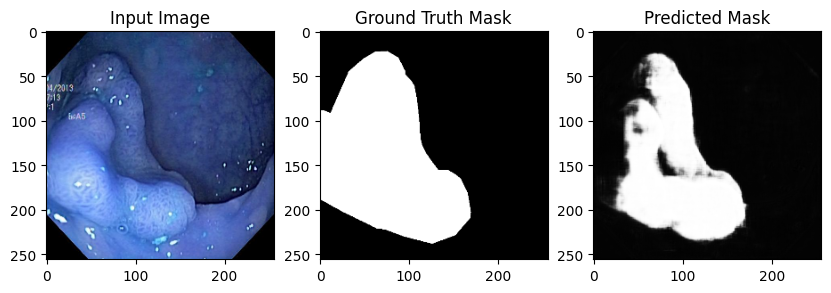

Validation Loop, Epoch: 0: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.710793463083414, Validation accuracy: 0.9069896936416626,DICE:0.6768225568991441,IOU: 0.5131725668907166
EPOCH 1:


Training Loop, Epoch: 1: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7506477065092636, Training accuracy: 0.9488543272018433, DICE:0.7597088241210358 ,IOU: 0.6065987348556519


Validation Loop, Epoch: 1:   0%|          | 0/13 [00:00<?, ?it/s]

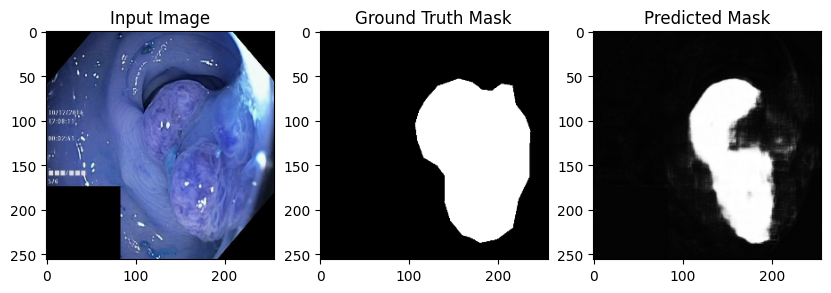

Validation Loop, Epoch: 1: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7098248371711144, Validation accuracy: 0.9061246514320374,DICE:0.6790620547074538,IOU: 0.5172172784805298
EPOCH 2:


Training Loop, Epoch: 2: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7199673398876315, Training accuracy: 0.9439593553543091, DICE:0.7583731997482593 ,IOU: 0.6056519746780396


Validation Loop, Epoch: 2:   0%|          | 0/13 [00:00<?, ?it/s]

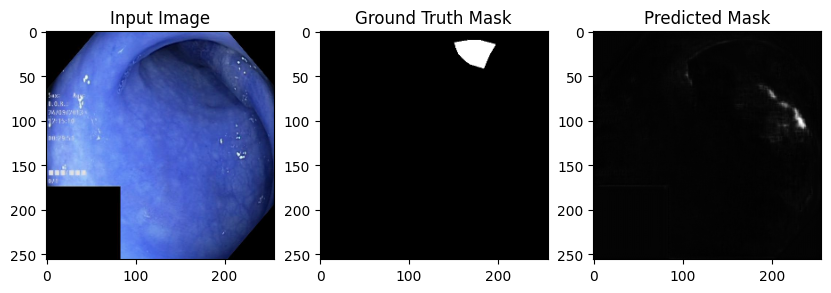

Validation Loop, Epoch: 2: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7110808079059308, Validation accuracy: 0.9096041321754456,DICE:0.6996051027224615,IOU: 0.546056866645813
EPOCH 3:


Training Loop, Epoch: 3: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7346174091985705, Training accuracy: 0.9443624019622803, DICE:0.7598845422038886 ,IOU: 0.6092692613601685


Validation Loop, Epoch: 3:   0%|          | 0/13 [00:00<?, ?it/s]

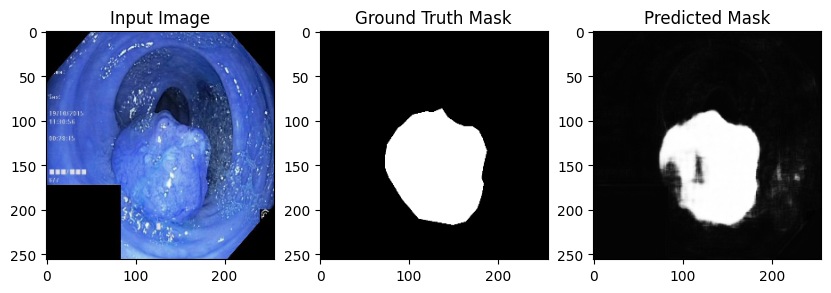

Validation Loop, Epoch: 3: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]


Validation loss: 0.7112036484938401, Validation accuracy: 0.9033260941505432,DICE:0.6770822061942174,IOU: 0.5150882005691528
EPOCH 4:


Training Loop, Epoch: 4: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7346185266393241, Training accuracy: 0.9443812966346741, DICE:0.7593667651410292 ,IOU: 0.6072283387184143


Validation Loop, Epoch: 4:   0%|          | 0/13 [00:00<?, ?it/s]

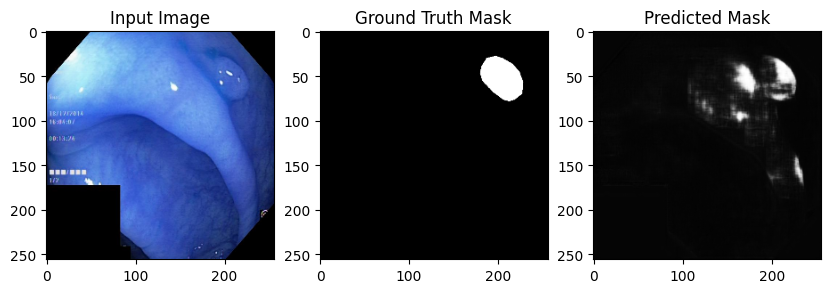

Validation Loop, Epoch: 4: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7096545696258545, Validation accuracy: 0.902766764163971,DICE:0.6796237918046805,IOU: 0.5177345275878906
EPOCH 5:


Training Loop, Epoch: 5: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.6997570439565536, Training accuracy: 0.9438145160675049, DICE:0.7582709994816689 ,IOU: 0.6057379841804504


Validation Loop, Epoch: 5:   0%|          | 0/13 [00:00<?, ?it/s]

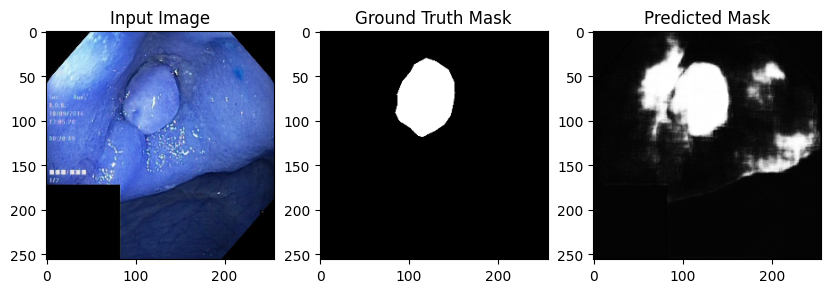

Validation Loop, Epoch: 5: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]


Validation loss: 0.7105602392783532, Validation accuracy: 0.9060667157173157,DICE:0.682228358892294,IOU: 0.5195879340171814
EPOCH 6:


Training Loop, Epoch: 6: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7136580050873524, Training accuracy: 0.9429253935813904, DICE:0.7538858680067537 ,IOU: 0.6005011796951294


Validation Loop, Epoch: 6:   0%|          | 0/13 [00:00<?, ?it/s]

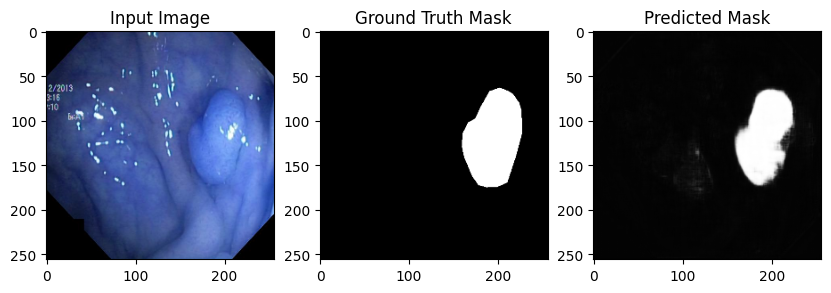

Validation Loop, Epoch: 6: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.710540193777818, Validation accuracy: 0.9086223244667053,DICE:0.6829019922476548,IOU: 0.5271596908569336
EPOCH 7:


Training Loop, Epoch: 7: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7373889619129653, Training accuracy: 0.9438430070877075, DICE:0.7578671944700441 ,IOU: 0.6056287884712219


Validation Loop, Epoch: 7:   0%|          | 0/13 [00:00<?, ?it/s]

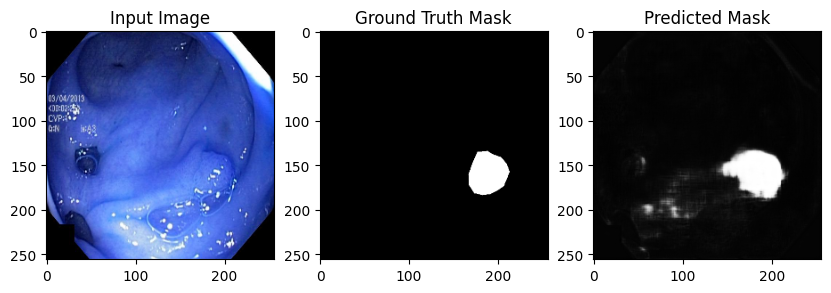

Validation Loop, Epoch: 7: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.7104816161669217, Validation accuracy: 0.9068001508712769,DICE:0.6866849660873413,IOU: 0.5264939069747925
EPOCH 8:


Training Loop, Epoch: 8: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7157415555596706, Training accuracy: 0.9438475370407104, DICE:0.7569540138494228 ,IOU: 0.604205310344696


Validation Loop, Epoch: 8:   0%|          | 0/13 [00:00<?, ?it/s]

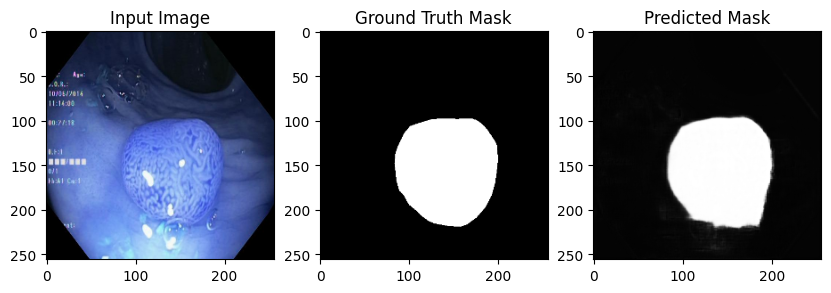

Validation Loop, Epoch: 8: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.7112868107282199, Validation accuracy: 0.906435489654541,DICE:0.681768733721513,IOU: 0.5238226056098938
EPOCH 9:


Training Loop, Epoch: 9: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.725858569953204, Training accuracy: 0.9442155361175537, DICE:0.758751591434978 ,IOU: 0.6066194176673889


Validation Loop, Epoch: 9:   0%|          | 0/13 [00:00<?, ?it/s]

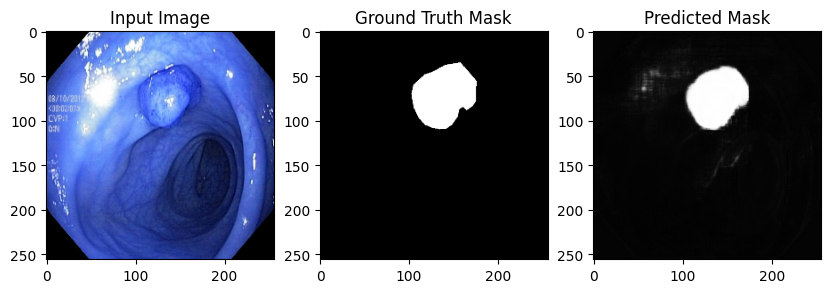

Validation Loop, Epoch: 9: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]


Validation loss: 0.7092799681883591, Validation accuracy: 0.9068922400474548,DICE:0.6839583928768451,IOU: 0.5219631195068359
EPOCH 10:


Training Loop, Epoch: 10: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.6973956060571146, Training accuracy: 0.9444001317024231, DICE:0.7595281426189523 ,IOU: 0.6083755493164062


Validation Loop, Epoch: 10:   0%|          | 0/13 [00:00<?, ?it/s]

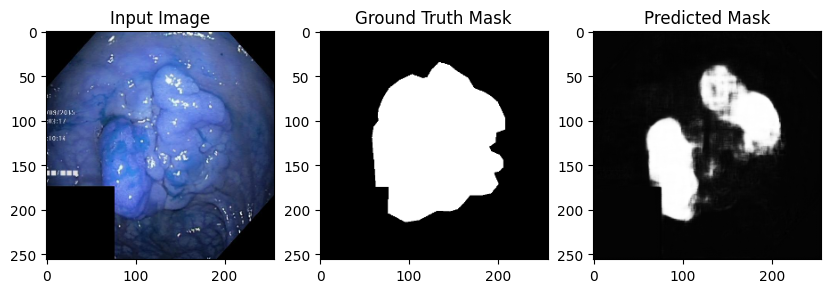

Validation Loop, Epoch: 10: 100%|██████████| 13/13 [00:05<00:00,  2.43it/s]


Validation loss: 0.7103948730688828, Validation accuracy: 0.9056742787361145,DICE:0.6820329152620755,IOU: 0.5233111381530762
EPOCH 11:


Training Loop, Epoch: 11: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7310714801791562, Training accuracy: 0.9439063668251038, DICE:0.7586678215346301 ,IOU: 0.6061336994171143


Validation Loop, Epoch: 11:   0%|          | 0/13 [00:00<?, ?it/s]

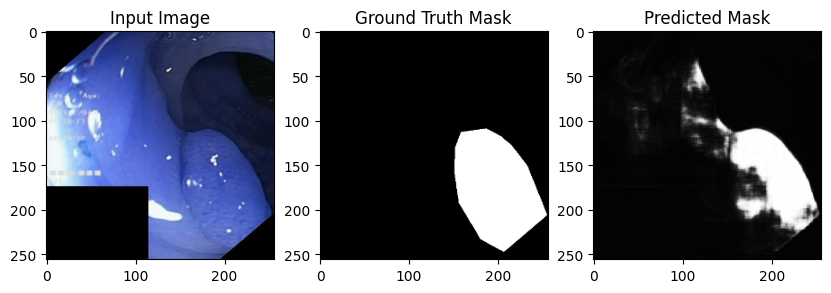

Validation Loop, Epoch: 11: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7100302760417645, Validation accuracy: 0.9080047011375427,DICE:0.6774083788578327,IOU: 0.5165594220161438
EPOCH 12:


Training Loop, Epoch: 12: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7321927477531497, Training accuracy: 0.9437801837921143, DICE:0.7574129485060405 ,IOU: 0.6048237681388855


Validation Loop, Epoch: 12:   0%|          | 0/13 [00:00<?, ?it/s]

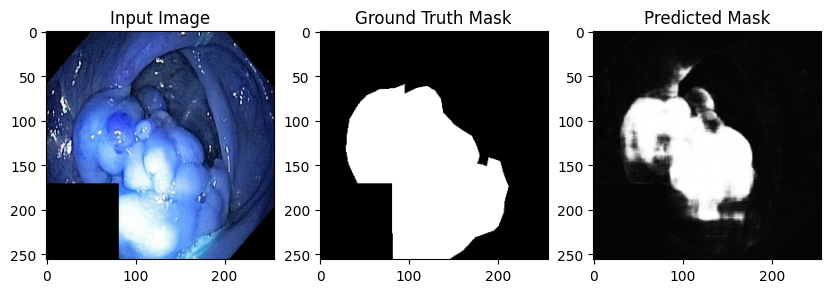

Validation Loop, Epoch: 12: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]


Validation loss: 0.7105566125649673, Validation accuracy: 0.9073952436447144,DICE:0.6784308781990638,IOU: 0.5179290175437927
EPOCH 13:


Training Loop, Epoch: 13: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7311081360372162, Training accuracy: 0.9431859850883484, DICE:0.7552241535643134 ,IOU: 0.6026307344436646


Validation Loop, Epoch: 13:   0%|          | 0/13 [00:00<?, ?it/s]

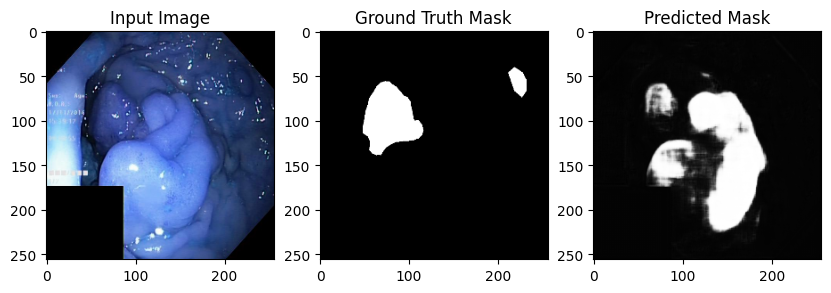

Validation Loop, Epoch: 13: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7116187994296734, Validation accuracy: 0.9049314856529236,DICE:0.6715065217935122,IOU: 0.5143607258796692
EPOCH 14:


Training Loop, Epoch: 14: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7412756790133163, Training accuracy: 0.9440792798995972, DICE:0.7598588547143527 ,IOU: 0.6078063249588013


Validation Loop, Epoch: 14:   0%|          | 0/13 [00:00<?, ?it/s]

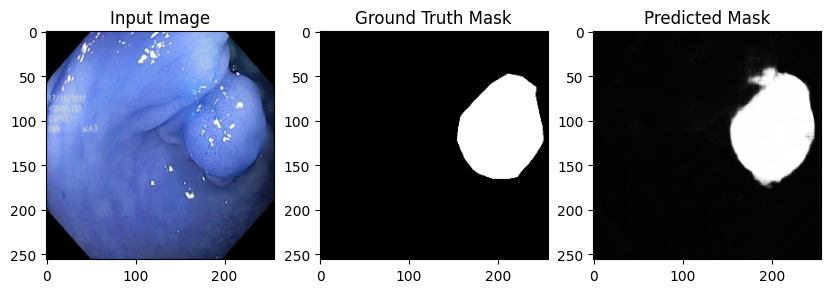

Validation Loop, Epoch: 14: 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]


Validation loss: 0.7105901470551124, Validation accuracy: 0.907580554485321,DICE:0.6832267733720633,IOU: 0.5235825777053833
EPOCH 15:


Training Loop, Epoch: 15: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7148544099120534, Training accuracy: 0.9438629150390625, DICE:0.7599391032875243 ,IOU: 0.6084567308425903


Validation Loop, Epoch: 15:   0%|          | 0/13 [00:00<?, ?it/s]

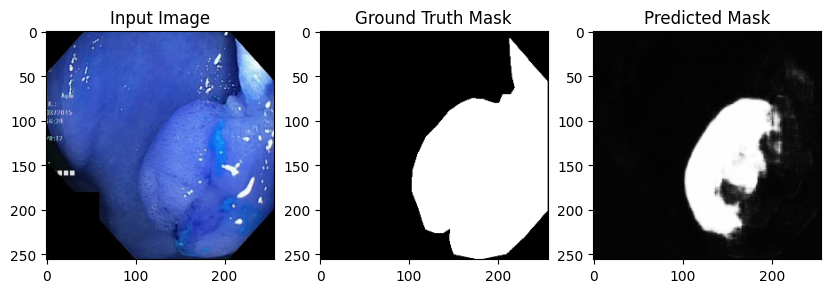

Validation Loop, Epoch: 15: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7117445147954501, Validation accuracy: 0.9079626798629761,DICE:0.6894482511740464,IOU: 0.5316545963287354
EPOCH 16:


Training Loop, Epoch: 16: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7362327776475514, Training accuracy: 0.9438613653182983, DICE:0.7571592157872928 ,IOU: 0.6044378280639648


Validation Loop, Epoch: 16:   0%|          | 0/13 [00:00<?, ?it/s]

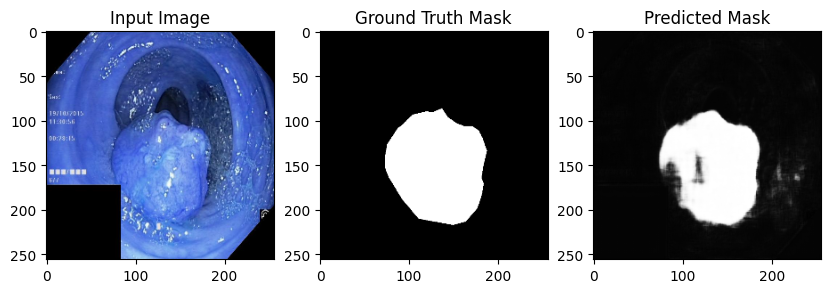

Validation Loop, Epoch: 16: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.7117698651093703, Validation accuracy: 0.9072495698928833,DICE:0.6816110840210547,IOU: 0.5208855867385864
EPOCH 17:


Training Loop, Epoch: 17: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7525838450632965, Training accuracy: 0.9447877407073975, DICE:0.7609223171587636 ,IOU: 0.6089891791343689


Validation Loop, Epoch: 17:   0%|          | 0/13 [00:00<?, ?it/s]

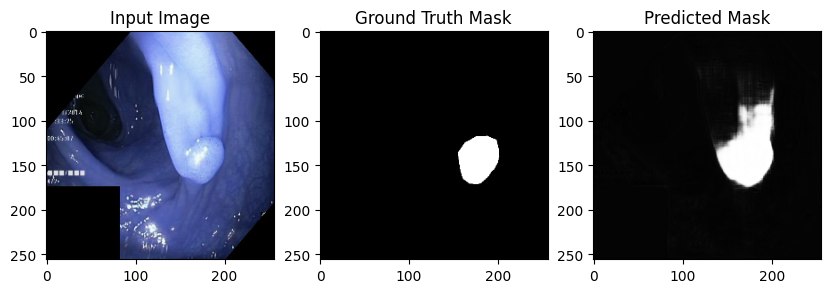

Validation Loop, Epoch: 17: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.7107387368495648, Validation accuracy: 0.907809853553772,DICE:0.6842875251403222,IOU: 0.5246557593345642
EPOCH 18:


Training Loop, Epoch: 18: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7261634608825892, Training accuracy: 0.942882239818573, DICE:0.7532371760299124 ,IOU: 0.6003391742706299


Validation Loop, Epoch: 18:   0%|          | 0/13 [00:00<?, ?it/s]

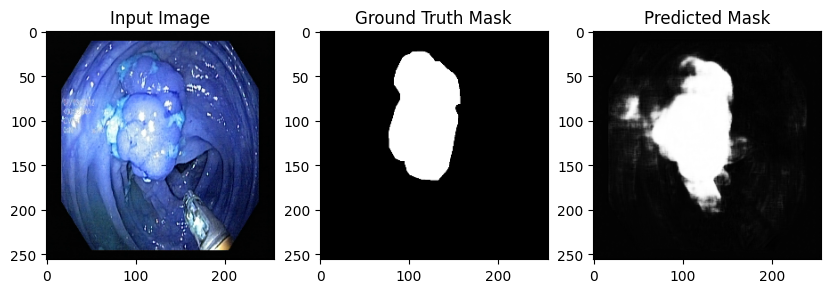

Validation Loop, Epoch: 18: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7108199275456942, Validation accuracy: 0.9077118635177612,DICE:0.687254433448498,IOU: 0.5308877825737
EPOCH 19:


Training Loop, Epoch: 19: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7096250667983708, Training accuracy: 0.9440014958381653, DICE:0.759047045471053 ,IOU: 0.6072805523872375


Validation Loop, Epoch: 19:   0%|          | 0/13 [00:00<?, ?it/s]

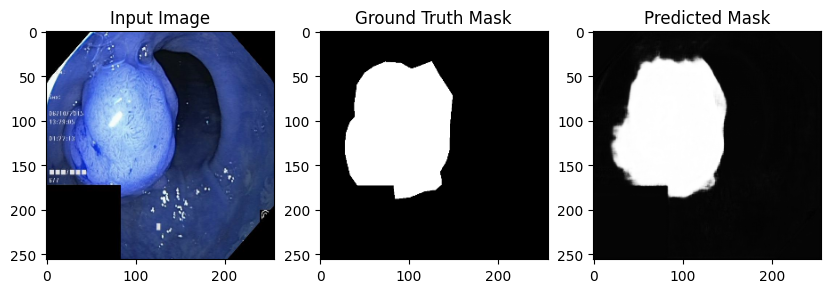

Validation Loop, Epoch: 19: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]


Validation loss: 0.7114819104854877, Validation accuracy: 0.9074075818061829,DICE:0.6783894254611089,IOU: 0.5177683234214783
EPOCH 20:


Training Loop, Epoch: 20: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7512916720207818, Training accuracy: 0.9437153935432434, DICE:0.7572395685148592 ,IOU: 0.6056684255599976


Validation Loop, Epoch: 20:   0%|          | 0/13 [00:00<?, ?it/s]

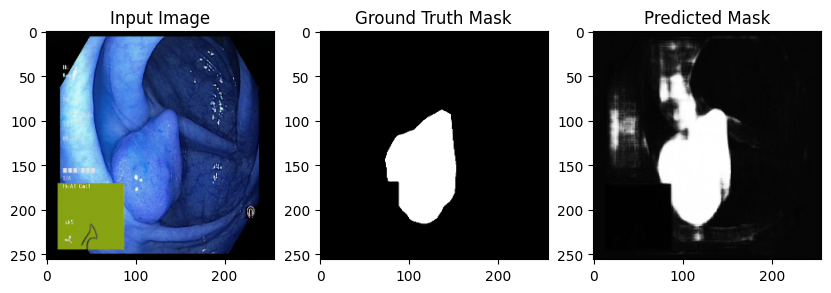

Validation Loop, Epoch: 20: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7113467730008639, Validation accuracy: 0.9075502753257751,DICE:0.6907638448935288,IOU: 0.5339828729629517
EPOCH 21:


Training Loop, Epoch: 21: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7331020029312298, Training accuracy: 0.9436579942703247, DICE:0.7575071296748169 ,IOU: 0.604988157749176


Validation Loop, Epoch: 21:   0%|          | 0/13 [00:00<?, ?it/s]

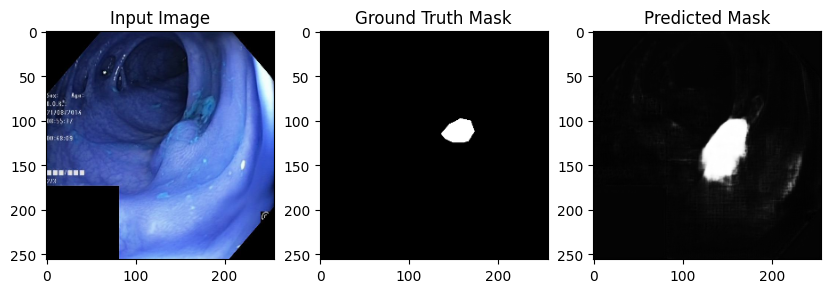

Validation Loop, Epoch: 21: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.710888725060683, Validation accuracy: 0.9081572890281677,DICE:0.6898127840115473,IOU: 0.5306494832038879
EPOCH 22:


Training Loop, Epoch: 22: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7270909674801945, Training accuracy: 0.9416036605834961, DICE:0.7487476536465817 ,IOU: 0.5941770672798157


Validation Loop, Epoch: 22:   0%|          | 0/13 [00:00<?, ?it/s]

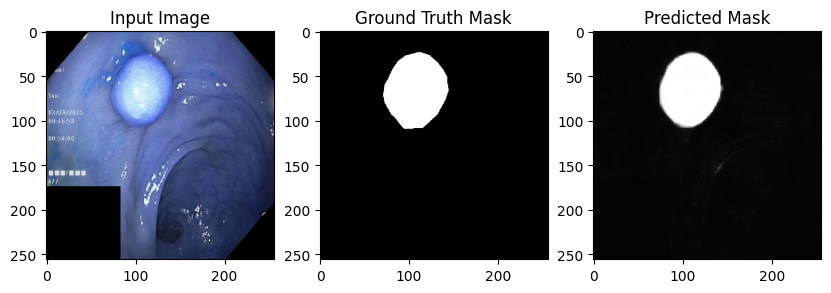

Validation Loop, Epoch: 22: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7107885067279522, Validation accuracy: 0.9077233672142029,DICE:0.6769054807149447,IOU: 0.5167845487594604
EPOCH 23:


Training Loop, Epoch: 23: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.7355803992903998, Training accuracy: 0.943017840385437, DICE:0.7576733316358589 ,IOU: 0.6060501933097839


Validation Loop, Epoch: 23:   0%|          | 0/13 [00:00<?, ?it/s]

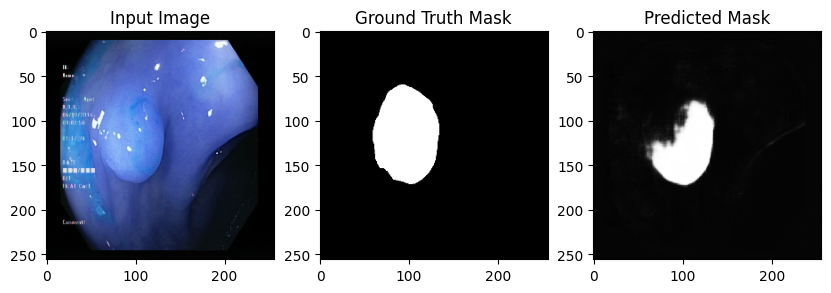

Validation Loop, Epoch: 23: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.71102342238793, Validation accuracy: 0.9082635045051575,DICE:0.693805822959313,IOU: 0.5363534688949585
EPOCH 24:


Training Loop, Epoch: 24: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]


Training loss: 0.716953982405974, Training accuracy: 0.9433646202087402, DICE:0.7572280301359825 ,IOU: 0.6046285629272461


Validation Loop, Epoch: 24:   0%|          | 0/13 [00:00<?, ?it/s]

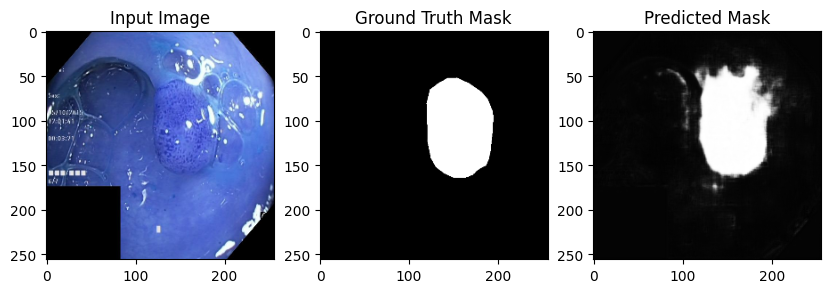

Validation Loop, Epoch: 24: 100%|██████████| 13/13 [00:05<00:00,  2.44it/s]


Validation loss: 0.7104749175218436, Validation accuracy: 0.908015787601471,DICE:0.6920965909957886,IOU: 0.5340664386749268
EPOCH 25:


Training Loop, Epoch: 25: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]


Training loss: 0.7120826742945734, Training accuracy: 0.9445365071296692, DICE:0.760803941753919 ,IOU: 0.6084372997283936


Validation Loop, Epoch: 25:   0%|          | 0/13 [00:00<?, ?it/s]

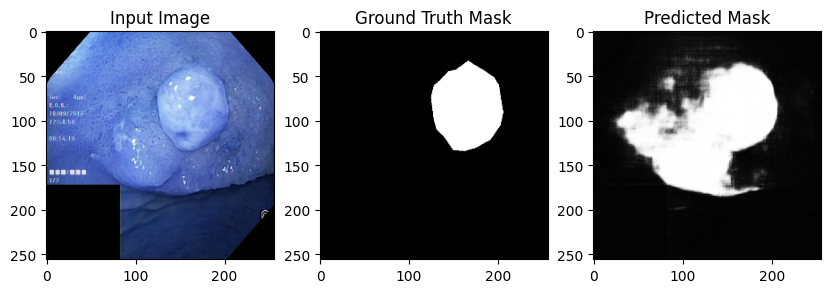

Validation Loop, Epoch: 25: 100%|██████████| 13/13 [00:05<00:00,  2.42it/s]


Validation loss: 0.7088688107637259, Validation accuracy: 0.9069864153862,DICE:0.6815461470530584,IOU: 0.5235110521316528
EPOCH 26:


Training Loop, Epoch: 26: 100%|██████████| 50/50 [00:41<00:00,  1.20it/s]


Training loss: 0.6746938405472014, Training accuracy: 0.9436283111572266, DICE:0.7569596553617203 ,IOU: 0.6042172908782959


Validation Loop, Epoch: 26:   0%|          | 0/13 [00:00<?, ?it/s]

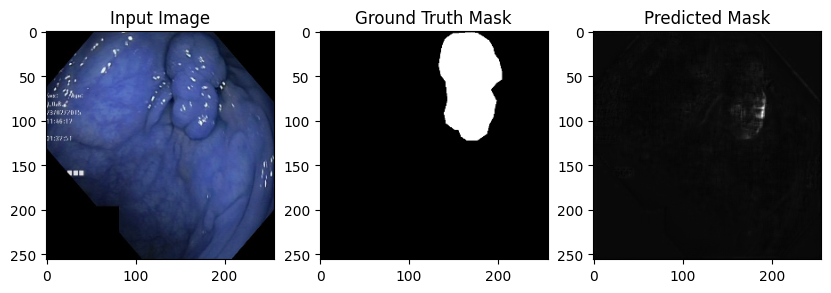

Validation Loop, Epoch: 26: 100%|██████████| 13/13 [00:05<00:00,  2.44it/s]


Validation loss: 0.7122026498501117, Validation accuracy: 0.9060083627700806,DICE:0.6710126881416028,IOU: 0.5110852122306824
EPOCH 27:


Training Loop, Epoch: 27: 100%|██████████| 50/50 [00:41<00:00,  1.20it/s]


Training loss: 0.7497947028836368, Training accuracy: 0.9434174299240112, DICE:0.7555762453571429 ,IOU: 0.6029573082923889


Validation Loop, Epoch: 27:   0%|          | 0/13 [00:00<?, ?it/s]

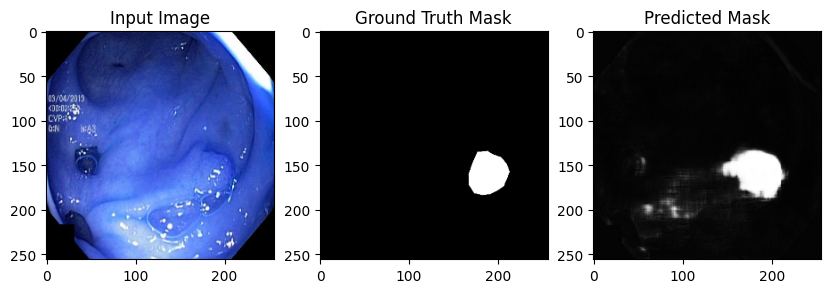

Validation Loop, Epoch: 27: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7111151860310481, Validation accuracy: 0.9056029915809631,DICE:0.6757032229350164,IOU: 0.5138322114944458
EPOCH 28:


Training Loop, Epoch: 28:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]


KeyboardInterrupt: 

In [56]:
for epoch in range(epochs):
    print(f"EPOCH {epoch}:")

    student_model.train()
    model.eval()

    for batch in tqdm(train_loader, desc=f"Training Loop, Epoch: {epoch}"):
        img, mask = batch['image'], batch['mask']
        img, mask = img.to(device), mask.to(device)

        # Forward pass with the larger U-Net to get teacher outputs
        with torch.no_grad():
            teacher_outputs = model(img)

        optimizer.zero_grad()

        # Forward pass with the smaller U-Net
        outputs = student_model(img)

        # Compute the knowledge distillation loss
        kd_loss = distillation_loss(outputs, mask, teacher_outputs)

        # Add your segmentation loss (e.g., cross-entropy or dice loss)
        segmentation_loss = criterion(outputs, mask)

        # Combine the knowledge distillation loss and the segmentation loss
        total_loss = kd_loss + segmentation_loss

        total_loss.backward()
        optimizer.step()
        with torch.no_grad():
            accuracy = dice_index(outputs, mask)
            iou=calculate_iou(outputs,mask)
            pacc=pixel_acc(outputs,mask)
            batch_loss += loss.item()
            batch_acc += accuracy.item()
            batch_iou+=iou
            batch_pacc+=pacc

    batch_loss /= len(train_loader)
    batch_acc /= len(train_loader)
    batch_iou/=len(train_loader)
    batch_pacc/=len(train_loader)
    print(f"Training loss: {batch_loss}, Training accuracy: {batch_pacc}, DICE:{batch_acc} ,IOU: {batch_iou}")
    student_model.eval()
    val_loss = val_acc = val_iou=val_pacc=0.0

    with torch.no_grad():
        sample_printed = False
        for batch in tqdm(val_loader, desc=f"Validation Loop, Epoch: {epoch}"):
            # Move data to CUDA
            img, mask = batch['image'], batch['mask']
            img, mask = img.to(device), mask.to(device)
            
            
            outs = student_model(img)
            loss=criterion(outs, mask)
            iou=calculate_iou(outs,mask)
            pacc=pixel_acc(outs,mask)
            accuracy = dice_index(outs, mask)
            val_loss += loss.item()
            val_acc += accuracy.item()
            val_iou+=iou
            val_pacc+=pacc
            
            if not sample_printed:
                sample_printed = True
                idx = 0  # Choose the index of the sample to print
                sample_img = img[idx].cpu().numpy().transpose((1, 2, 0))
                sample_mask = mask[idx].cpu().numpy()
                sample_pred = outs[idx].cpu().numpy()

                plt.figure(figsize=(10, 5))
                plt.subplot(1, 3, 1)
                plt.imshow(sample_img)
                plt.title("Input Image")

                plt.subplot(1, 3, 2)

                # Check if the mask is 2D or 3D
                if sample_mask.ndim == 3 and sample_mask.shape[0] == 1:
                    sample_mask = sample_mask[0]  # Remove the singleton dimension

                plt.imshow(sample_mask, cmap='gray')
                plt.title("Ground Truth Mask")

                plt.subplot(1, 3, 3)

                # Check if the prediction is 2D or 3D
                if sample_pred.ndim == 3 and sample_pred.shape[0] == 1:
                    sample_pred = sample_pred[0]  # Remove the singleton dimension

                plt.imshow(sample_pred, cmap='gray')
                plt.title("Predicted Mask")

                plt.show()

    val_loss /= len(val_loader)
    val_acc /= len(val_loader)
    val_iou/=len(val_loader)
    val_pacc/=len(val_loader)
    print(f"Validation loss: {val_loss}, Validation accuracy: {val_pacc},DICE:{val_acc},IOU: {val_iou}")
        

## student model without distillation

Using device: cuda
EPOCH 0:


Training Loop, Epoch: 0: 100%|██████████| 50/50 [00:34<00:00,  1.45it/s]


Training loss: 0.8685484933853149, Training accuracy: 0.7158676981925964, DICE:0.41636189714074134 ,IOU: 0.26638033986091614


Validation Loop, Epoch: 0:   0%|          | 0/13 [00:00<?, ?it/s]

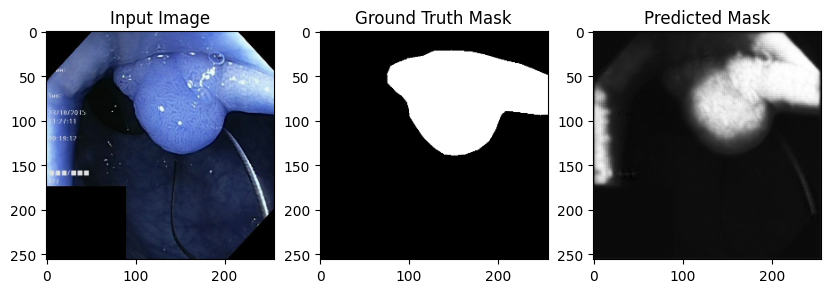

Validation Loop, Epoch: 0: 100%|██████████| 13/13 [00:05<00:00,  2.31it/s]


Validation loss: 0.8505853643784156, Validation accuracy: 0.7566638588905334,DICE:0.41349891974375796,IOU: 0.2616214156150818
EPOCH 1:


Training Loop, Epoch: 1: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.859250705242157, Training accuracy: 0.7478774785995483, DICE:0.4343493050336838 ,IOU: 0.2801627218723297


Validation Loop, Epoch: 1:   0%|          | 0/13 [00:00<?, ?it/s]

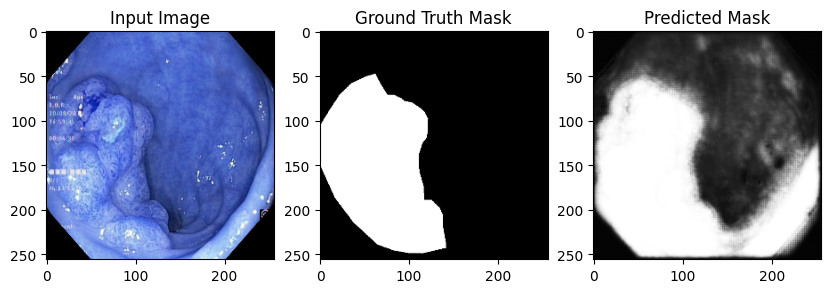

Validation Loop, Epoch: 1: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]


Validation loss: 0.8921214892314031, Validation accuracy: 0.6859268546104431,DICE:0.4447547701688913,IOU: 0.2888862192630768
EPOCH 2:


Training Loop, Epoch: 2: 100%|██████████| 50/50 [00:33<00:00,  1.47it/s]


Training loss: 0.8477818667888641, Training accuracy: 0.7869662046432495, DICE:0.47876569628715515 ,IOU: 0.3183196485042572


Validation Loop, Epoch: 2:   0%|          | 0/13 [00:00<?, ?it/s]

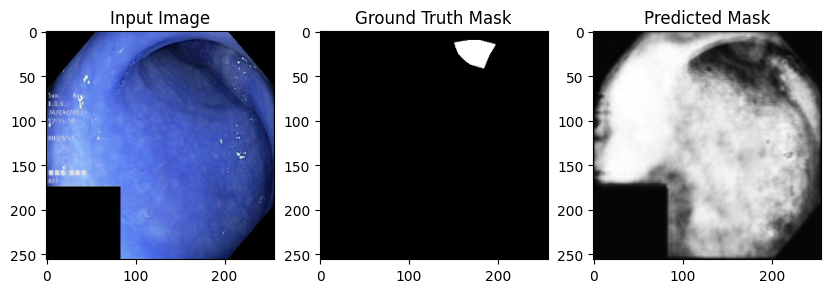

Validation Loop, Epoch: 2: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.9033576571024381, Validation accuracy: 0.6172122359275818,DICE:0.42556244822648853,IOU: 0.27388256788253784
EPOCH 3:


Training Loop, Epoch: 3: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.8377256000041962, Training accuracy: 0.8141053318977356, DICE:0.5091103678941726 ,IOU: 0.3455975651741028


Validation Loop, Epoch: 3:   0%|          | 0/13 [00:00<?, ?it/s]

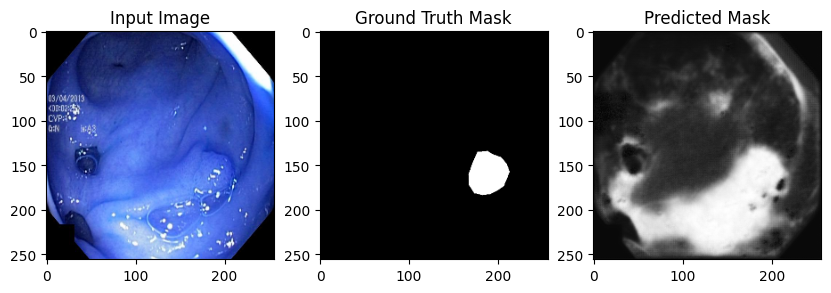

Validation Loop, Epoch: 3: 100%|██████████| 13/13 [00:05<00:00,  2.44it/s]


Validation loss: 0.8114833969336289, Validation accuracy: 0.8383598923683167,DICE:0.5241585305103889,IOU: 0.35730430483818054
EPOCH 4:


Training Loop, Epoch: 4: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.8290632927417755, Training accuracy: 0.8239354491233826, DICE:0.5347472953796387 ,IOU: 0.3683214485645294


Validation Loop, Epoch: 4:   0%|          | 0/13 [00:00<?, ?it/s]

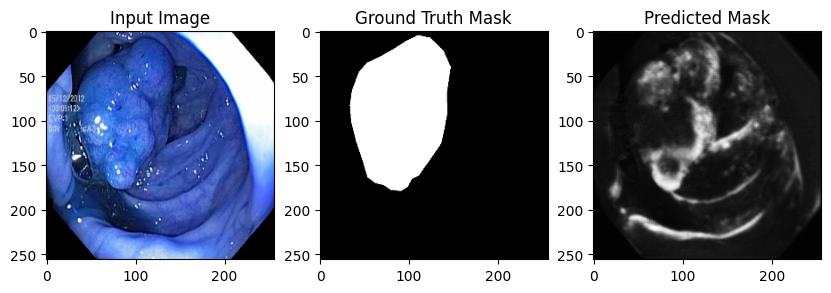

Validation Loop, Epoch: 4: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.797020815885984, Validation accuracy: 0.8417942523956299,DICE:0.21963781691514528,IOU: 0.12499168515205383
EPOCH 5:


Training Loop, Epoch: 5: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.8207466638088227, Training accuracy: 0.8370185494422913, DICE:0.553032900094986 ,IOU: 0.3858184814453125


Validation Loop, Epoch: 5:   0%|          | 0/13 [00:00<?, ?it/s]

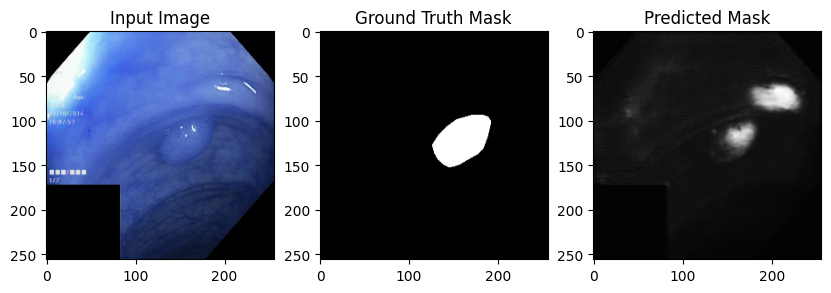

Validation Loop, Epoch: 5: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7946986235105075, Validation accuracy: 0.8591080904006958,DICE:0.45529345824168277,IOU: 0.2955748736858368
EPOCH 6:


Training Loop, Epoch: 6: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.815108803510666, Training accuracy: 0.8388888835906982, DICE:0.5517424976825714 ,IOU: 0.3847084045410156


Validation Loop, Epoch: 6:   0%|          | 0/13 [00:00<?, ?it/s]

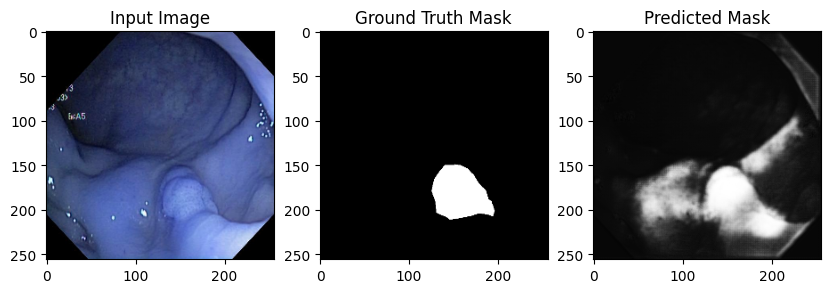

Validation Loop, Epoch: 6: 100%|██████████| 13/13 [00:05<00:00,  2.44it/s]


Validation loss: 0.8326728160564716, Validation accuracy: 0.7891323566436768,DICE:0.5344463357558618,IOU: 0.3693017065525055
EPOCH 7:


Training Loop, Epoch: 7: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.8082332468032837, Training accuracy: 0.8486664891242981, DICE:0.5620239186286926 ,IOU: 0.39464595913887024


Validation Loop, Epoch: 7:   0%|          | 0/13 [00:00<?, ?it/s]

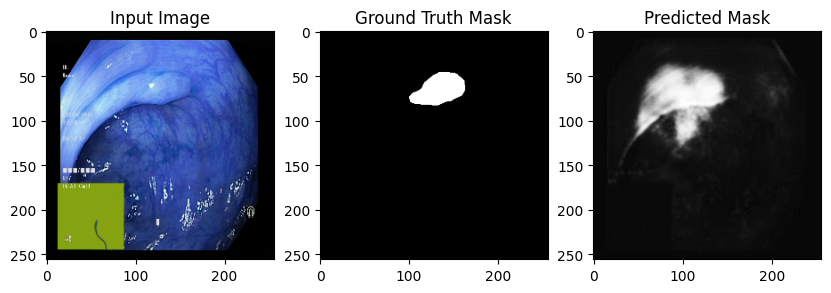

Validation Loop, Epoch: 7: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.8003870065395648, Validation accuracy: 0.8441497683525085,DICE:0.5689462400399722,IOU: 0.39961978793144226
EPOCH 8:


Training Loop, Epoch: 8: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.8025340521335602, Training accuracy: 0.8530263304710388, DICE:0.5654999619722366 ,IOU: 0.3972751200199127


Validation Loop, Epoch: 8:   0%|          | 0/13 [00:00<?, ?it/s]

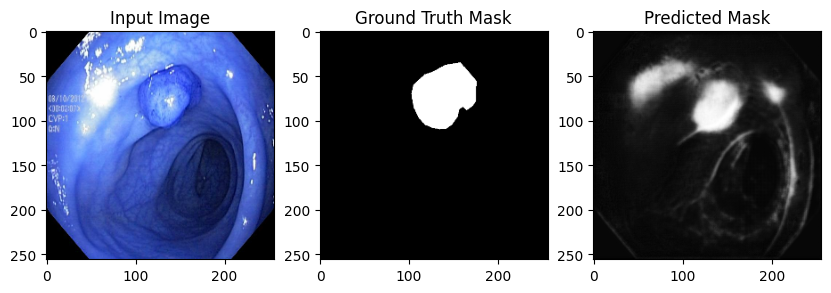

Validation Loop, Epoch: 8: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.777282911997575, Validation accuracy: 0.8609795570373535,DICE:0.4269968202480903,IOU: 0.2735893726348877
EPOCH 9:


Training Loop, Epoch: 9: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7953907322883605, Training accuracy: 0.8624094724655151, DICE:0.5858518248796463 ,IOU: 0.4171633720397949


Validation Loop, Epoch: 9:   0%|          | 0/13 [00:00<?, ?it/s]

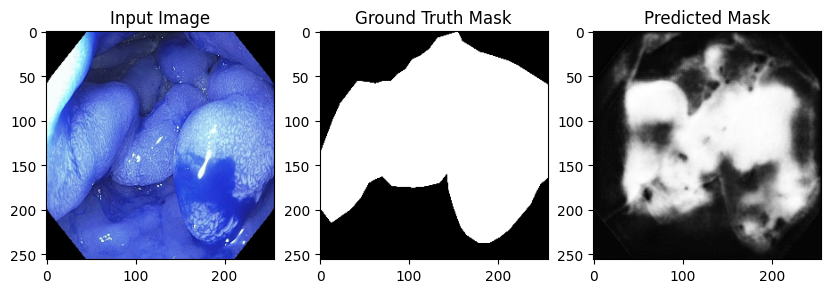

Validation Loop, Epoch: 9: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.782242687848898, Validation accuracy: 0.8654299378395081,DICE:0.5526129007339478,IOU: 0.38241079449653625
EPOCH 10:


Training Loop, Epoch: 10: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7899324917793273, Training accuracy: 0.8656479716300964, DICE:0.590243313908577 ,IOU: 0.42158403992652893


Validation Loop, Epoch: 10:   0%|          | 0/13 [00:00<?, ?it/s]

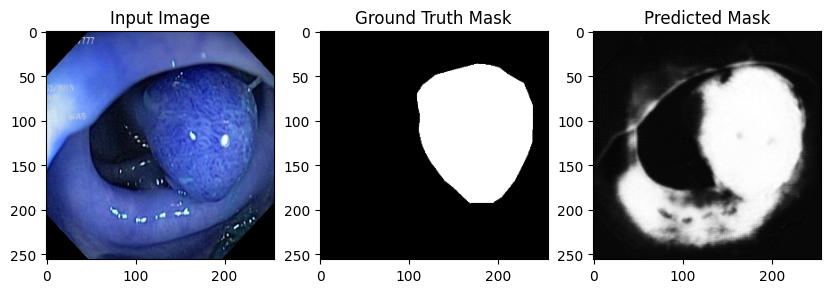

Validation Loop, Epoch: 10: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7900504240622888, Validation accuracy: 0.8415778279304504,DICE:0.5599740720712222,IOU: 0.3903844952583313
EPOCH 11:


Training Loop, Epoch: 11: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.784428459405899, Training accuracy: 0.8699766397476196, DICE:0.596915962100029 ,IOU: 0.4285714328289032


Validation Loop, Epoch: 11:   0%|          | 0/13 [00:00<?, ?it/s]

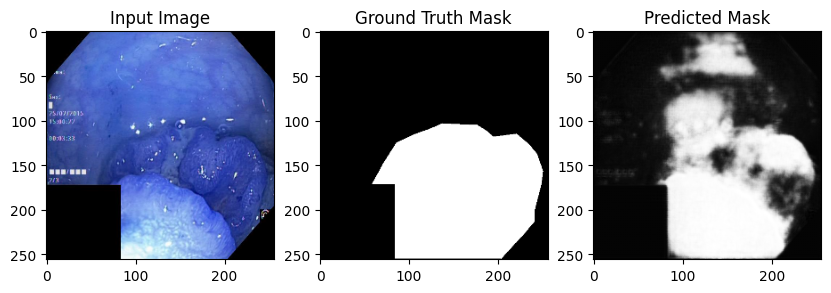

Validation Loop, Epoch: 11: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.8264509668717017, Validation accuracy: 0.7665746212005615,DICE:0.5298921855596396,IOU: 0.365011990070343
EPOCH 12:


Training Loop, Epoch: 12: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7793486166000366, Training accuracy: 0.8730232119560242, DICE:0.6031661665439606 ,IOU: 0.43543967604637146


Validation Loop, Epoch: 12:   0%|          | 0/13 [00:00<?, ?it/s]

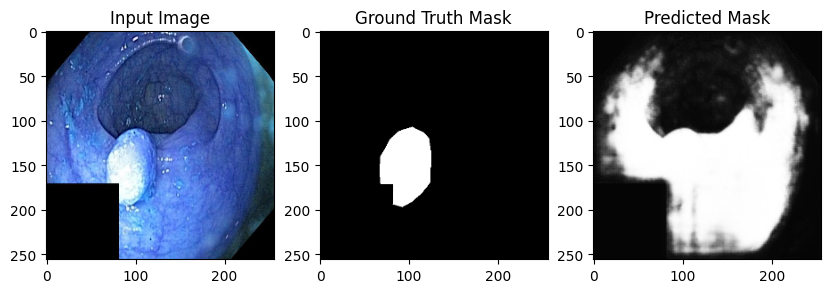

Validation Loop, Epoch: 12: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.8274628520011902, Validation accuracy: 0.7609092593193054,DICE:0.5344801384669083,IOU: 0.36775556206703186
EPOCH 13:


Training Loop, Epoch: 13: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7741795217990876, Training accuracy: 0.8785815238952637, DICE:0.6140247303247451 ,IOU: 0.44708189368247986


Validation Loop, Epoch: 13:   0%|          | 0/13 [00:00<?, ?it/s]

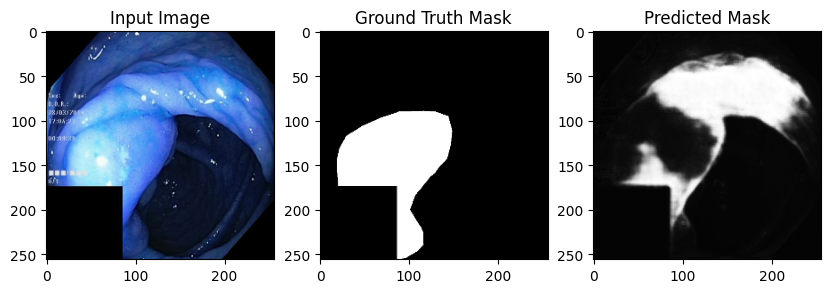

Validation Loop, Epoch: 13: 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]


Validation loss: 0.7642971093838031, Validation accuracy: 0.87027508020401,DICE:0.5728018260919131,IOU: 0.4034232795238495
EPOCH 14:


Training Loop, Epoch: 14: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7699362468719483, Training accuracy: 0.8791253566741943, DICE:0.6131792718172073 ,IOU: 0.4458285868167877


Validation Loop, Epoch: 14:   0%|          | 0/13 [00:00<?, ?it/s]

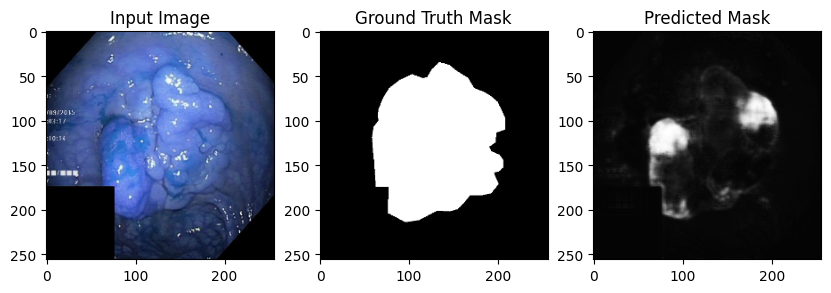

Validation Loop, Epoch: 14: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.7521722775239211, Validation accuracy: 0.8743838667869568,DICE:0.5008926368676699,IOU: 0.34020644426345825
EPOCH 15:


Training Loop, Epoch: 15: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7649553263187409, Training accuracy: 0.8842970132827759, DICE:0.623499448299408 ,IOU: 0.45600199699401855


Validation Loop, Epoch: 15:   0%|          | 0/13 [00:00<?, ?it/s]

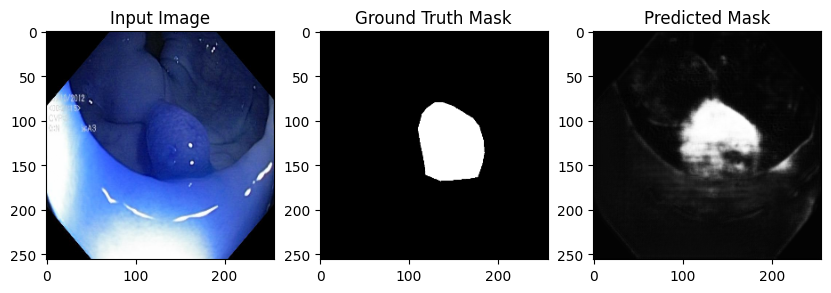

Validation Loop, Epoch: 15: 100%|██████████| 13/13 [00:05<00:00,  2.44it/s]


Validation loss: 0.7505546762393072, Validation accuracy: 0.873569667339325,DICE:0.45186129441628087,IOU: 0.2950516939163208
EPOCH 16:


Training Loop, Epoch: 16: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7619216823577881, Training accuracy: 0.8834673166275024, DICE:0.6199590992927552 ,IOU: 0.4527776539325714


Validation Loop, Epoch: 16:   0%|          | 0/13 [00:00<?, ?it/s]

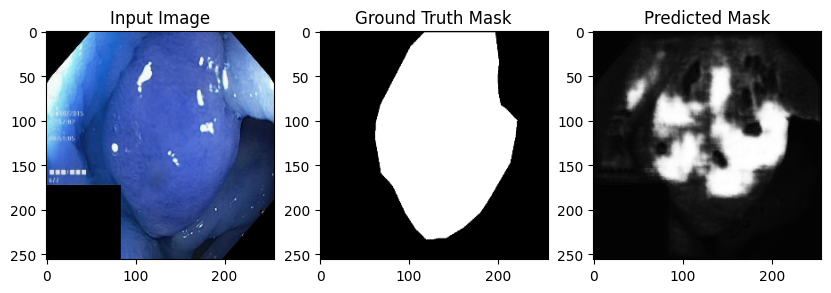

Validation Loop, Epoch: 16: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7598791993581332, Validation accuracy: 0.8754531145095825,DICE:0.6196852418092581,IOU: 0.45081064105033875
EPOCH 17:


Training Loop, Epoch: 17: 100%|██████████| 50/50 [00:33<00:00,  1.47it/s]


Training loss: 0.7555366969108581, Training accuracy: 0.8921876549720764, DICE:0.6438590919971466 ,IOU: 0.4768447279930115


Validation Loop, Epoch: 17:   0%|          | 0/13 [00:00<?, ?it/s]

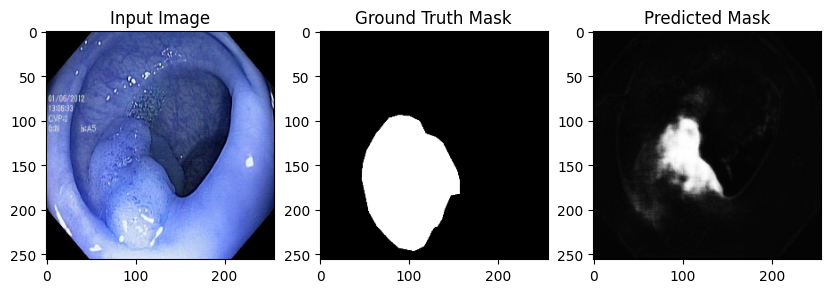

Validation Loop, Epoch: 17: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7454820183607248, Validation accuracy: 0.8552022576332092,DICE:0.28302416663903457,IOU: 0.167869433760643
EPOCH 18:


Training Loop, Epoch: 18: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7520709323883057, Training accuracy: 0.8936738967895508, DICE:0.6455502659082413 ,IOU: 0.4802219271659851


Validation Loop, Epoch: 18:   0%|          | 0/13 [00:00<?, ?it/s]

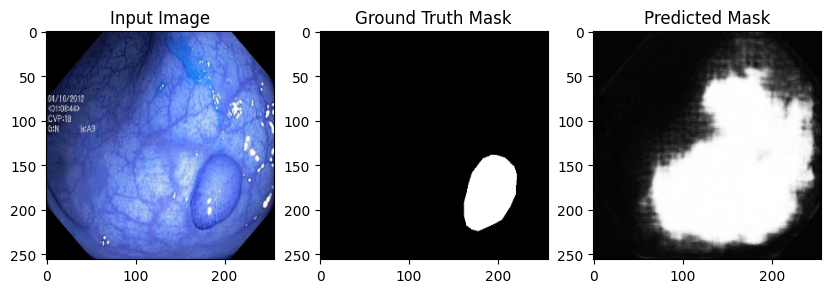

Validation Loop, Epoch: 18: 100%|██████████| 13/13 [00:05<00:00,  2.44it/s]


Validation loss: 0.752776888700632, Validation accuracy: 0.8795658349990845,DICE:0.650518733721513,IOU: 0.48600319027900696
EPOCH 19:


Training Loop, Epoch: 19: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7479058575630187, Training accuracy: 0.8969448804855347, DICE:0.6554192388057709 ,IOU: 0.48993971943855286


Validation Loop, Epoch: 19:   0%|          | 0/13 [00:00<?, ?it/s]

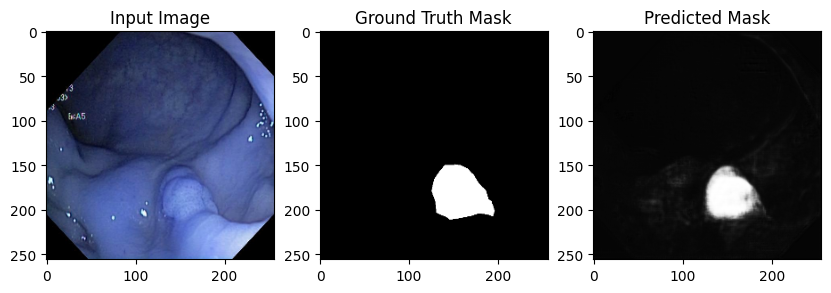

Validation Loop, Epoch: 19: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7390260100364685, Validation accuracy: 0.8862554430961609,DICE:0.595951511309697,IOU: 0.4259709119796753
EPOCH 20:


Training Loop, Epoch: 20: 100%|██████████| 50/50 [00:33<00:00,  1.47it/s]


Training loss: 0.7443044984340668, Training accuracy: 0.8981817960739136, DICE:0.6629985636472702 ,IOU: 0.49839359521865845


Validation Loop, Epoch: 20:   0%|          | 0/13 [00:00<?, ?it/s]

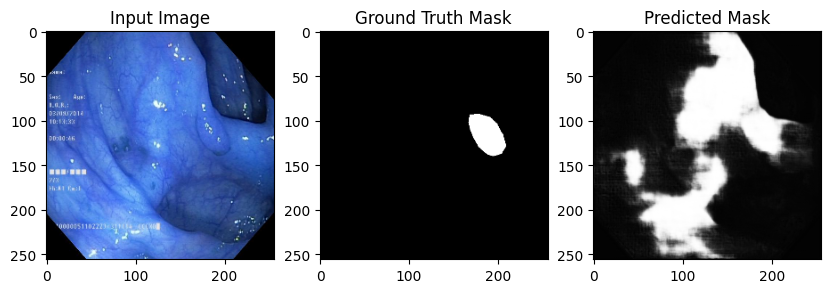

Validation Loop, Epoch: 20: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.7539631403409518, Validation accuracy: 0.8625022768974304,DICE:0.6071215730447036,IOU: 0.4398498237133026
EPOCH 21:


Training Loop, Epoch: 21: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7396695554256439, Training accuracy: 0.9039517641067505, DICE:0.6725533723831176 ,IOU: 0.5101791024208069


Validation Loop, Epoch: 21:   0%|          | 0/13 [00:00<?, ?it/s]

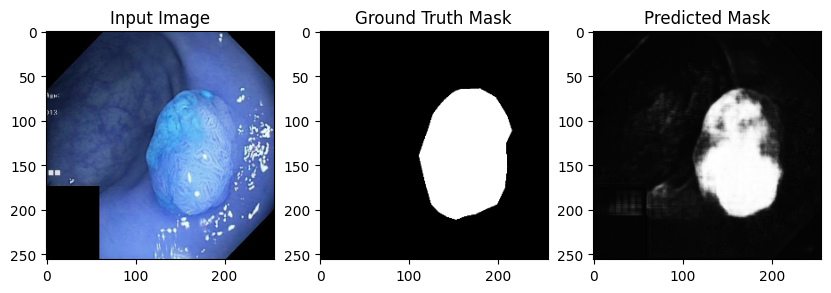

Validation Loop, Epoch: 21: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]


Validation loss: 0.7280253630418044, Validation accuracy: 0.8941729068756104,DICE:0.5825440012491666,IOU: 0.4137797951698303
EPOCH 22:


Training Loop, Epoch: 22: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7341616344451904, Training accuracy: 0.9110433459281921, DICE:0.698566951751709 ,IOU: 0.5392352342605591


Validation Loop, Epoch: 22:   0%|          | 0/13 [00:00<?, ?it/s]

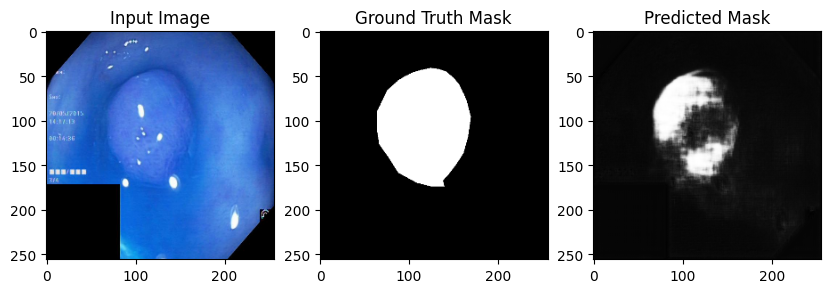

Validation Loop, Epoch: 22: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7246834773283738, Validation accuracy: 0.8871979117393494,DICE:0.5564007231822381,IOU: 0.38990527391433716
EPOCH 23:


Training Loop, Epoch: 23: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7328571283817291, Training accuracy: 0.9089794754981995, DICE:0.6905037879943847 ,IOU: 0.5299504995346069


Validation Loop, Epoch: 23:   0%|          | 0/13 [00:00<?, ?it/s]

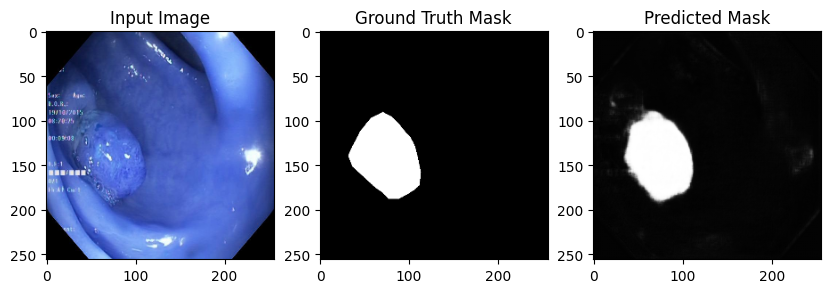

Validation Loop, Epoch: 23: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.7211501369109521, Validation accuracy: 0.8974953889846802,DICE:0.619405943613786,IOU: 0.45537880063056946
EPOCH 24:


Training Loop, Epoch: 24: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7275571143627166, Training accuracy: 0.9160168170928955, DICE:0.7135526931285858 ,IOU: 0.5572482347488403


Validation Loop, Epoch: 24:   0%|          | 0/13 [00:00<?, ?it/s]

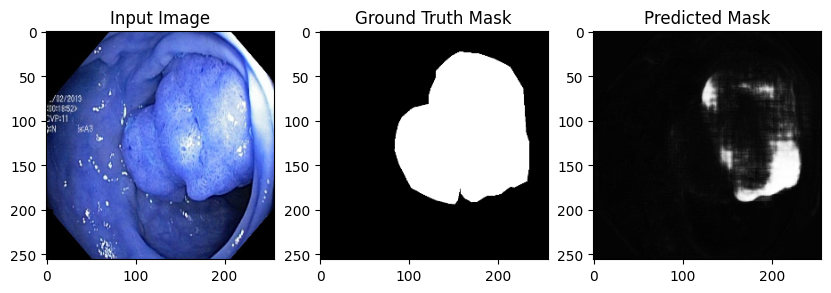

Validation Loop, Epoch: 24: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7232114030764654, Validation accuracy: 0.8803526163101196,DICE:0.4946283239584703,IOU: 0.3286353051662445
EPOCH 25:


Training Loop, Epoch: 25: 100%|██████████| 50/50 [00:33<00:00,  1.47it/s]


Training loss: 0.7259712433815002, Training accuracy: 0.9142250418663025, DICE:0.7065048587322235 ,IOU: 0.5482719540596008


Validation Loop, Epoch: 25:   0%|          | 0/13 [00:00<?, ?it/s]

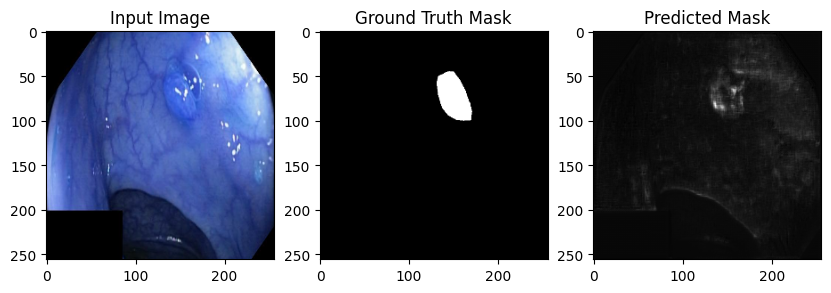

Validation Loop, Epoch: 25: 100%|██████████| 13/13 [00:05<00:00,  2.38it/s]


Validation loss: 0.7222882509231567, Validation accuracy: 0.8861760497093201,DICE:0.5090800798856295,IOU: 0.34546083211898804
EPOCH 26:


Training Loop, Epoch: 26: 100%|██████████| 50/50 [00:33<00:00,  1.47it/s]


Training loss: 0.7225478959083557, Training accuracy: 0.9179675579071045, DICE:0.7153665769100189 ,IOU: 0.5600998401641846


Validation Loop, Epoch: 26:   0%|          | 0/13 [00:00<?, ?it/s]

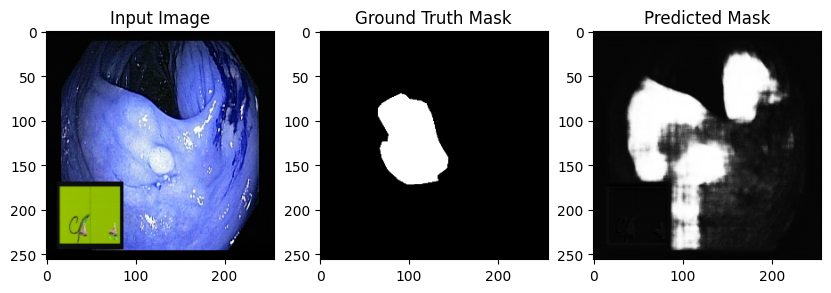

Validation Loop, Epoch: 26: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]


Validation loss: 0.7186299654153677, Validation accuracy: 0.9028435349464417,DICE:0.6770570736664993,IOU: 0.5167877078056335
EPOCH 27:


Training Loop, Epoch: 27: 100%|██████████| 50/50 [00:33<00:00,  1.48it/s]


Training loss: 0.7208314490318298, Training accuracy: 0.9165176153182983, DICE:0.7156965398788452 ,IOU: 0.5616523027420044


Validation Loop, Epoch: 27:   0%|          | 0/13 [00:00<?, ?it/s]

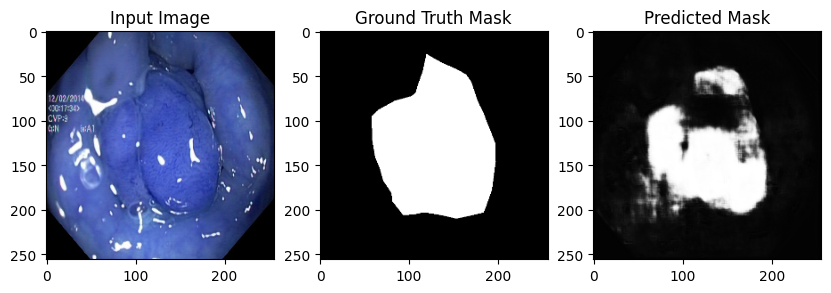

Validation Loop, Epoch: 27: 100%|██████████| 13/13 [00:05<00:00,  2.44it/s]


Validation loss: 0.7159433502417344, Validation accuracy: 0.8879732489585876,DICE:0.5351032477158767,IOU: 0.3692310154438019
EPOCH 28:


Training Loop, Epoch: 28: 100%|██████████| 50/50 [00:33<00:00,  1.47it/s]


Training loss: 0.7172331058979035, Training accuracy: 0.92123943567276, DICE:0.7284622752666473 ,IOU: 0.5757531523704529


Validation Loop, Epoch: 28:   0%|          | 0/13 [00:00<?, ?it/s]

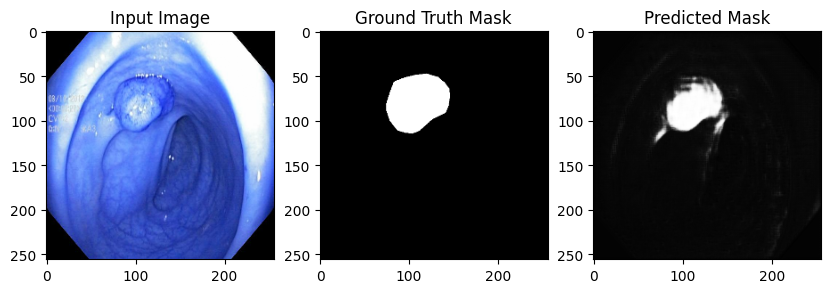

Validation Loop, Epoch: 28: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]


Validation loss: 0.7133116401158847, Validation accuracy: 0.8998205065727234,DICE:0.6363849914990939,IOU: 0.46851614117622375
EPOCH 29:


Training Loop, Epoch: 29: 100%|██████████| 50/50 [00:33<00:00,  1.47it/s]


Training loss: 0.7137969660758973, Training accuracy: 0.9247175455093384, DICE:0.7404463267326356 ,IOU: 0.5901913046836853


Validation Loop, Epoch: 29:   0%|          | 0/13 [00:00<?, ?it/s]

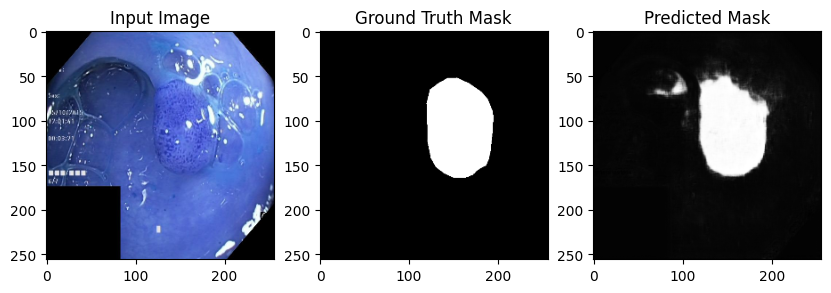

Validation Loop, Epoch: 29: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]

Validation loss: 0.7101017145010141, Validation accuracy: 0.8949318528175354,DICE:0.5712115237346063,IOU: 0.40794244408607483


In [40]:
# Check for CUDA availability
from unet import UNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

def init_weights(m):
    if isinstance(m, torch.nn.Conv2d):
        torch.nn.init.xavier_uniform(m.weight)

# Initialize the model
small_model = UNet(3, 1, [64, 128, 256])

# Move the model to the CUDA device if available
small_model = small_model.to(device)

epochs = 30
lr = 0.001
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(params=small_model.parameters(), lr=lr)
# Training and validation code
for epoch in range(epochs):
    print(f"EPOCH {epoch}:")
    small_model.train()
    batch_loss = batch_acc = batch_iou=batch_pacc=0.0

    for batch in tqdm(train_loader, desc=f"Training Loop, Epoch: {epoch}"):
        # Move data to CUDA
        img, mask = batch['image'], batch['mask']
        img, mask = img.to(device), mask.to(device)
        optimizer.zero_grad()
        outs = small_model(img)
        # loss=dice_loss(outs, mask)
        loss=criterion(outs,mask)
        # loss = class_balanced_focal_ce_loss(outs, mask, weights=class_weights, gamma=2)
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            accuracy = dice_index(outs, mask)
            iou=calculate_iou(outs,mask)
            pacc=pixel_acc(outs,mask)
            batch_loss += loss.item()
            batch_acc += accuracy.item()
            batch_iou+=iou
            batch_pacc+=pacc

    batch_loss /= len(train_loader)
    batch_acc /= len(train_loader)
    batch_iou/=len(train_loader)
    batch_pacc/=len(train_loader)
    print(f"Training loss: {batch_loss}, Training accuracy: {batch_pacc}, DICE:{batch_acc} ,IOU: {batch_iou}")
    small_model.eval()
    val_loss = val_acc = val_iou=val_pacc=0.0

    with torch.no_grad():
        sample_printed = False
        for batch in tqdm(val_loader, desc=f"Validation Loop, Epoch: {epoch}"):
            # Move data to CUDA
            img, mask = batch['image'], batch['mask']
            img, mask = img.to(device), mask.to(device)
            
            
            outs = small_model(img)
            loss=criterion(outs, mask)
            iou=calculate_iou(outs,mask)
            pacc=pixel_acc(outs,mask)
            accuracy = dice_index(outs, mask)
            val_loss += loss.item()
            val_acc += accuracy.item()
            val_iou+=iou
            val_pacc+=pacc
            
            if not sample_printed:
                sample_printed = True
                idx = 0  # Choose the index of the sample to print
                sample_img = img[idx].cpu().numpy().transpose((1, 2, 0))
                sample_mask = mask[idx].cpu().numpy()
                sample_pred = outs[idx].cpu().numpy()

                plt.figure(figsize=(10, 5))
                plt.subplot(1, 3, 1)
                plt.imshow(sample_img)
                plt.title("Input Image")

                plt.subplot(1, 3, 2)

                # Check if the mask is 2D or 3D
                if sample_mask.ndim == 3 and sample_mask.shape[0] == 1:
                    sample_mask = sample_mask[0]  # Remove the singleton dimension

                plt.imshow(sample_mask, cmap='gray')
                plt.title("Ground Truth Mask")

                plt.subplot(1, 3, 3)

                # Check if the prediction is 2D or 3D
                if sample_pred.ndim == 3 and sample_pred.shape[0] == 1:
                    sample_pred = sample_pred[0]  # Remove the singleton dimension

                plt.imshow(sample_pred, cmap='gray')
                plt.title("Predicted Mask")

                plt.show()

    val_loss /= len(val_loader)
    val_acc /= len(val_loader)
    val_iou/=len(val_loader)
    val_pacc/=len(val_loader)
    print(f"Validation loss: {val_loss}, Validation accuracy: {val_pacc},DICE:{val_acc},IOU: {val_iou}")